In [1]:
#Things left for this EDA

#email distribution 
#unique values

#I have comebined mohti's EDA here, could not yet combine his work on percentage values and transaction amount distribution
#Refer his work in the  master workbook for the same

#Usama is working on Decision Tree model and please refer his work on encoding of the data and utilize Decision Tree as base line model.

#Uttkarsh is moving on to tackle class imablance and will work on Binomail Naive Bias.

#Please refer to the pair-plot for inter-variable dependence
#Also work on the co-relation matrix as well.


#These were the paramters that i found which seemed to hvae a positive corelation 
# C1 till rest of C
# D till rest of D

#also an interseting subset was found for the parameters
#'addr2','C11','D5','D8','D1','D15','V144','V145','V150','V151','V159','V160'

#the graphs for these parameters is shown in the end.



#Post corealation and data cleanup, use the SMOTE notebook to tackle class imabalce

#Just copy the code, and change the relevant columns as you deem fit.

#Post SMOTE, execute your classificaion algorithm and find the best possible output.

In [2]:
#Exploratory analysis of the data for the transaction model.


import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from sklearn import tree
from sklearn.tree.export import export_text
import graphviz
from sklearn import metrics
from sklearn.preprocessing import OneHotEncoder,LabelEncoder
import re


C:\Users\usama\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.tree.export module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.tree. Anything that cannot be imported from sklearn.tree is now part of the private API.
  warnings.warn(message, FutureWarning)


In [3]:
#loading the data using pandas
train_transaction = pd.read_csv('ieee-fraud-detection/train_transaction.csv',index_col='TransactionID')
test_transaction = pd.read_csv('ieee-fraud-detection/test_transaction.csv', index_col='TransactionID')

train_identity = pd.read_csv('ieee-fraud-detection/train_identity.csv',index_col='TransactionID')
test_identity = pd.read_csv('ieee-fraud-detection/test_identity.csv',index_col='TransactionID')

In [4]:
#get the basics for the train transaction

train_transaction.head()

,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
TransactionID,,,,,,,,,,,,,,,,,,,,,
2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,credit,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [5]:
train_identity.head()

,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
TransactionID,,,,,,,,,,,,,,,,,,,,,
2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,NaN,...,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device
2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,Windows
2987011,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,NaN,NaN,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,NaN
2987016,0.0,7460.0,0.0,0.0,1.0,0.0,NaN,NaN,0.0,0.0,...,chrome 62.0,24.0,1280x800,match_status:2,T,F,T,T,desktop,MacOS


In [6]:
# checking for the nan values since we have huge amount of features, hence putting the transaction data into a dataframe
train_null_dataframe = train_transaction.isnull().sum()
pd.DataFrame(train_null_dataframe).T

,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,0,0,0,0,0,8933,1565,1577,4259,1571,...,508189,508189,508189,508189,508189,508189,508189,508189,508189,508189


In [7]:
#checking for the nan values for the test_transaction 
test_null_dataframe = test_transaction.isnull().sum()
pd.DataFrame(test_null_dataframe).T

,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,0,0,0,0,8654,3002,3086,4547,3007,65609,...,430260,430260,430260,430260,430260,430260,430260,430260,430260,430260


In [8]:
#now checking for the identity database for the nan values
train_id_null_dataframe = train_identity.isnull().sum()
pd.DataFrame(train_id_null_dataframe).T

,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,0,3361,77909,77909,7368,7368,139078,139078,69307,69307,...,3951,66647,70944,66428,3248,3248,3248,3248,3423,25567


In [9]:
test_id_null_dataframe = test_identity.isnull().sum()
pd.DataFrame(test_id_null_dataframe).T

,id-01,id-02,id-03,id-04,id-05,id-06,id-07,id-08,id-09,id-10,...,id-31,id-32,id-33,id-34,id-35,id-36,id-37,id-38,DeviceType,DeviceInfo
0,0,4931,75426,75426,7157,7157,136848,136848,67569,67569,...,5282,71236,71236,69732,4930,4930,4930,4930,4976,26850


In [10]:
#Since as observed, there are nan values for the data present, hence we will tackle this via
# 1.We will drop columns with 90 percent null values
# 2. We will fill the nan values


In [11]:
# Once we have checked for the NaN, we will check for the class balance.
# Since we plan to use Decision Tree as our baseline for the model, hence checking for class imbalance.

# Thus we will check for isFraud columns of the data

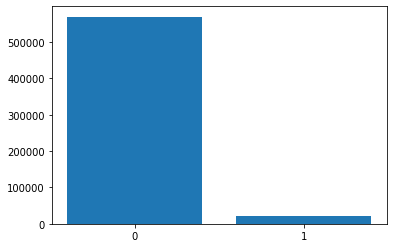

In [12]:
#Thus significant amount of class imbalance is observed.
import matplotlib.pyplot as plt

labels = ['0','1']

plt.bar(labels,train_transaction['isFraud'].value_counts())
plt.show()

In [13]:
#Solution is to solve the class imablance, by sampling such that the features and relevant information is not lost.


In [14]:
#Now checking the data again and as well as the explanation of the model, logic dictates the following

#Humans are creatures of habit, hence the time of the trasaction would play a importatnt role in determining if it was fraud or not

# The challenge of this dataset is that the given transaction time is not the time of the trasaction but the delta time.
#Thus the time differential is given, and the first refrence is not not given.

In [15]:
#checking a sample TransactionDT 

train_transaction['TransactionDT']

TransactionID
2987000       86400
2987001       86401
2987002       86469
2987003       86499
2987004       86506
             ...   
3577535    15811047
3577536    15811049
3577537    15811079
3577538    15811088
3577539    15811131
Name: TransactionDT, Length: 590540, dtype: int64

In [16]:
train_transaction['TransactionDT'].apply(type)

TransactionID
2987000    <class 'int'>
2987001    <class 'int'>
2987002    <class 'int'>
2987003    <class 'int'>
2987004    <class 'int'>
               ...      
3577535    <class 'int'>
3577536    <class 'int'>
3577537    <class 'int'>
3577538    <class 'int'>
3577539    <class 'int'>
Name: TransactionDT, Length: 590540, dtype: object

In [17]:
# By checking both the outputs we know that the column values for the Decision Tree algorithm are integers.

# The next question is to normalize these values in such a way that these numbers refer to meaningful information.

#Assumptions which are possible.

# 1.the given time could be in ticks hence check the max and min values for the transaction DT

train_transaction['TransactionDT'].max()


15811131

In [18]:
train_transaction['TransactionDT'].min()

86400

In [19]:

# 2. The given value cannot be in ticks since the numerical values are smaller for ticks.
# 3. going by using the normal methods to check

# 4.Case 1 : if the values are seconds, then span is as follows

diff = train_transaction['TransactionDT'].max() - train_transaction['TransactionDT'].min()

#if the values are seconds then checking for the days -> 181 about 6 months which is plausible
print(diff/86400)

181.99920138888888


In [20]:
diff_test = test_transaction['TransactionDT'].max() - test_transaction['TransactionDT'].min()

print(diff_test/86400)

#this reinforces the assumption that the timespan is about 6 months for both the test and train data
#Thus the overall span of the data is 1 year.


182.99908564814814


In [21]:
#Another thing to check is that if there are time overlaps in the transactions i.e. around the same reference differential transactions
#were done.


In [22]:
train_transaction['TransactionDT'].head()

TransactionID
2987000    86400
2987001    86401
2987002    86469
2987003    86499
2987004    86506
Name: TransactionDT, dtype: int64

In [23]:
test_transaction['TransactionDT'].head()

TransactionID
3663549    18403224
3663550    18403263
3663551    18403310
3663552    18403310
3663553    18403317
Name: TransactionDT, dtype: int64

In [24]:
#getting the columns for the dataset is as following
print([*train_transaction.columns])

['isFraud', 'TransactionDT', 'TransactionAmt', 'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6', 'addr1', 'addr2', 'dist1', 'dist2', 'P_emaildomain', 'R_emaildomain', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84'

In [25]:
#From this point we wiil check either the co-relation or the graph plot of the data

# 1. Plotting the amount of the transaction against the TransactionDT,here we will focus only on IsFraud columns and then the other one.

Fraud_transaction = train_transaction[train_transaction['isFraud']==1]

In [26]:
Fraud_transaction.head()

,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
TransactionID,,,,,,,,,,,,,,,,,,,,,
2987203,1,89760,445.000,W,18268,583.0,150.0,visa,226.0,credit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987240,1,90193,37.098,C,13413,103.0,185.0,visa,137.0,credit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987243,1,90246,37.098,C,13413,103.0,185.0,visa,137.0,credit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987245,1,90295,37.098,C,13413,103.0,185.0,visa,137.0,credit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987288,1,90986,155.521,C,16578,545.0,185.0,visa,226.0,credit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


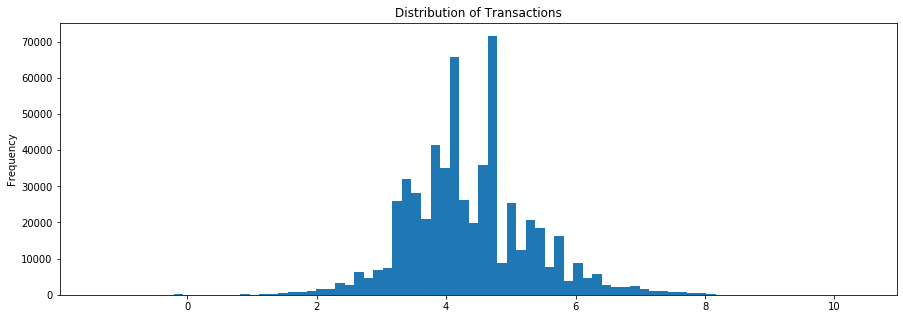

In [27]:
#The distribution of the transaction of the data.
# Since values were large hence for plotting they were normalized.

train_transaction['TransactionAmt'].apply(np.log).plot(kind='hist',bins=80,figsize=(15,5),title="Distribution of Transactions")
plt.show()


In [28]:
Valid_transaction = train_transaction[train_transaction['isFraud']==0]

In [29]:
Valid_transaction.head()

,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
TransactionID,,,,,,,,,,,,,,,,,,,,,
2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,credit,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


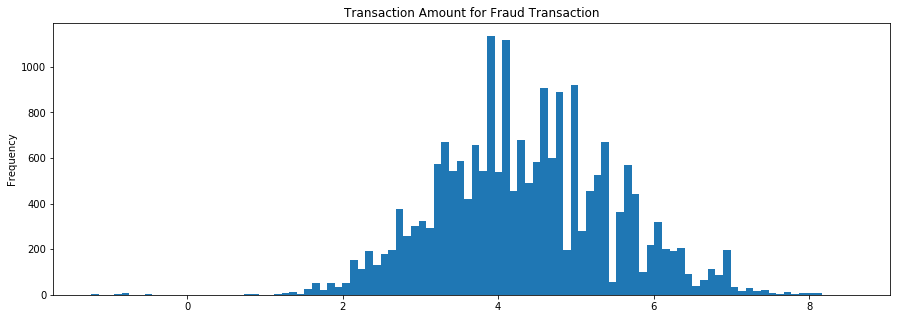

In [30]:
#Getting the distribution of the amount for fraud transactions


train_transaction[train_transaction['isFraud']==1]['TransactionAmt'].apply(np.log).plot(kind='hist',bins=100,figsize=(15,5),title="Transaction Amount for Fraud Transaction")
plt.show()

#this distribution would help in checking for the above average amount transactions which are fraud.

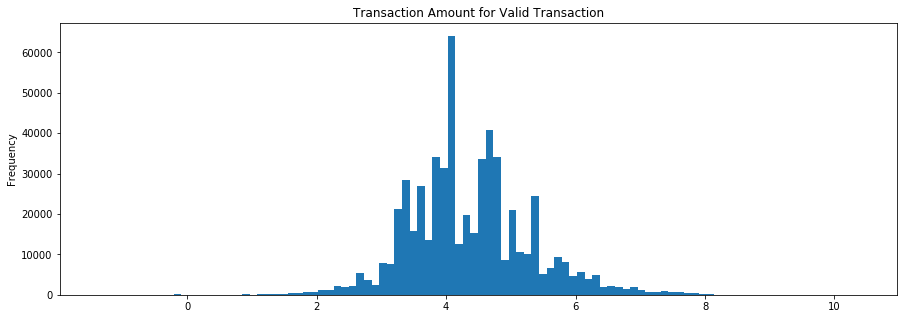

In [31]:
#Getting the distribution of the amount for valid transactions


train_transaction[train_transaction['isFraud']==0]['TransactionAmt'].apply(np.log).plot(kind='hist',bins=100,figsize=(15,5),title="Transaction Amount for Valid Transaction")
plt.show()

#this distribution would help in checking for the above average amount transactions which are fraud.

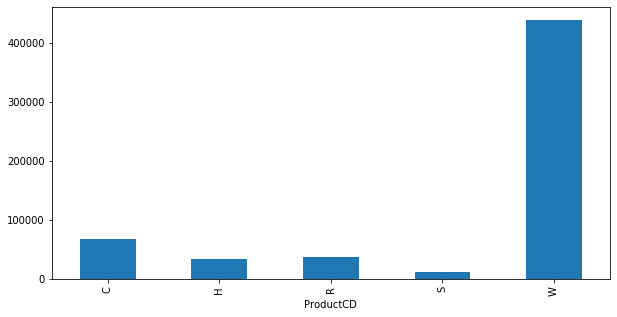

In [32]:
#Distribution of the product cd over the data
train_transaction.groupby('ProductCD')['ProductCD'].count().plot(kind='bar',figsize=(10,5))

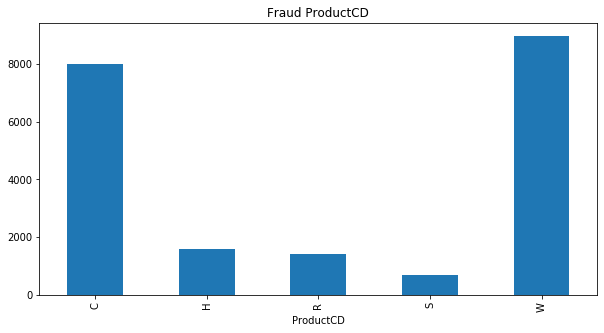

In [33]:
#now checking the distribution for the fraud data
fraud_product = train_transaction[train_transaction['isFraud']==1].groupby('ProductCD')['ProductCD'].count().plot(kind='bar',figsize=(10,5),title="Fraud ProductCD")

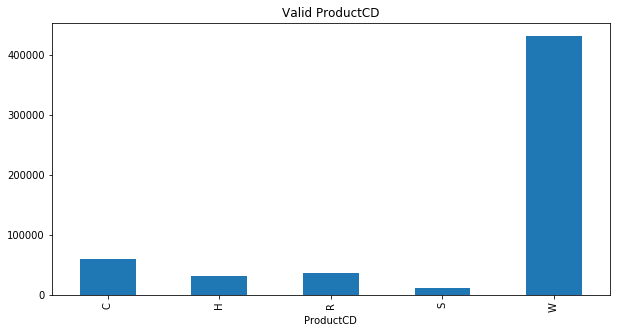

In [34]:
valid_product = train_transaction[train_transaction['isFraud']==0].groupby('ProductCD')['ProductCD'].count().plot(kind='bar',figsize=(10,5),title="Valid ProductCD")

In [35]:
#Distribution for the cards 1 till the rest

card_cols = [c for c in train_transaction.columns if 'card' in c]
train_transaction[card_cols].head()

,card1,card2,card3,card4,card5,card6
TransactionID,,,,,,
2987000,13926,NaN,150.0,discover,142.0,credit
2987001,2755,404.0,150.0,mastercard,102.0,credit
2987002,4663,490.0,150.0,visa,166.0,debit
2987003,18132,567.0,150.0,mastercard,117.0,debit
2987004,4497,514.0,150.0,mastercard,102.0,credit


In [36]:
#We checked the data type of the cards columns and observed the following
for c in card_cols:
    if train_transaction[c].dtype not in ['float64','int64']:
        print(c)

card4
card6


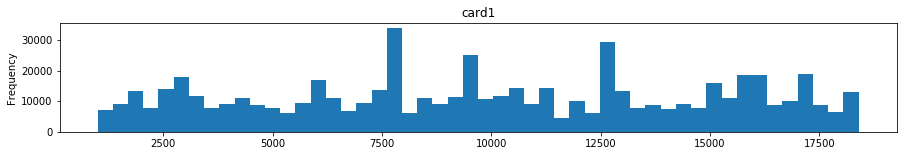

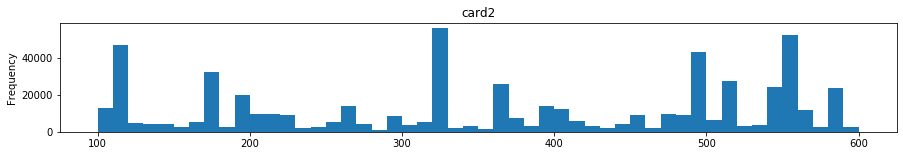

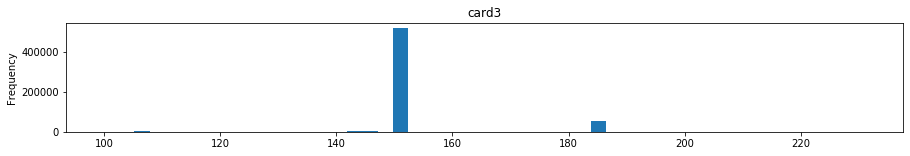

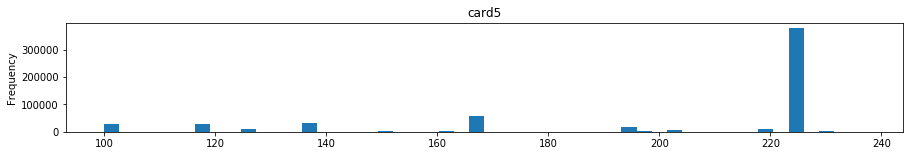

In [37]:
#The following is the distribution of the rest of the cards.
for c in card_cols:
    if train_transaction[c].dtype in ['float64','int64']:
        train_transaction[c].plot(kind='hist',
                                      title=c,
                                      bins=50,
                                      figsize=(15, 2))

    plt.show()


In [38]:
#Note : Card4 and Card5 may prove to be more insightful then the rest.


Card4_data = train_transaction['card4']

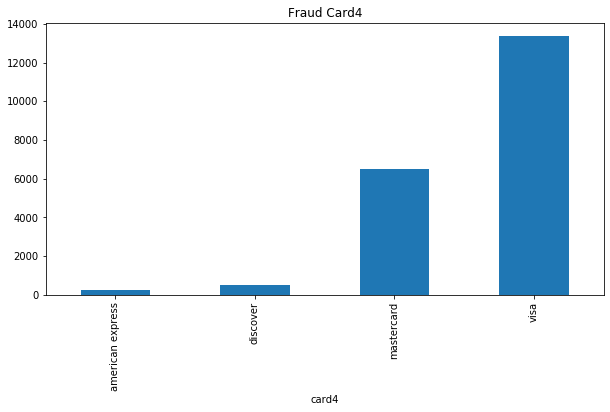

In [39]:
train_transaction[train_transaction['isFraud']==1].groupby('card4')['card4'].count().plot(kind='bar',figsize=(10,5),title="Fraud Card4")

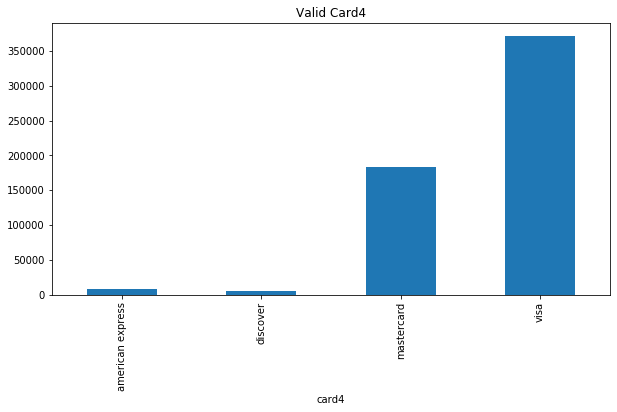

In [40]:
train_transaction[train_transaction['isFraud']==0].groupby('card4')['card4'].count().plot(kind='bar',figsize=(10,5),title="Valid Card4")

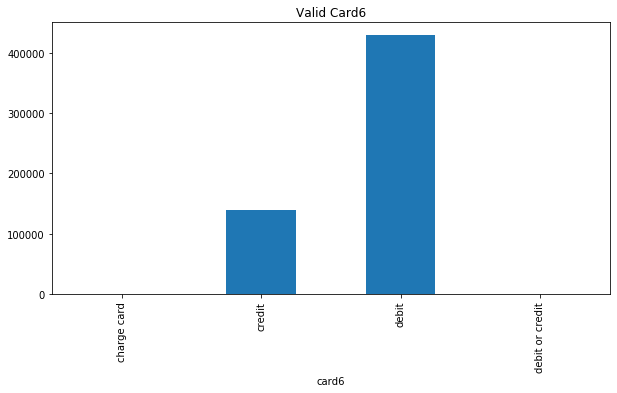

In [41]:
train_transaction[train_transaction['isFraud']==0].groupby('card6')['card6'].count().plot(kind='bar',figsize=(10,5),title="Valid Card6")

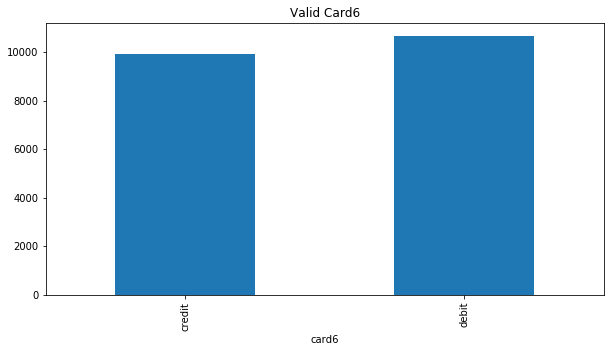

In [42]:
train_transaction[train_transaction['isFraud']==1].groupby('card6')['card6'].count().plot(kind='bar',figsize=(10,5),title="Valid Card6")

In [43]:
c_cols = [c for c in train_transaction if c[0] == 'C']
train_transaction[c_cols].head()

,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14
TransactionID,,,,,,,,,,,,,,
2987000,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0
2987001,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0
2987002,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0
2987003,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0
2987004,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0


In [44]:
train_transaction.head()

,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
TransactionID,,,,,,,,,,,,,,,,,,,,,
2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,credit,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


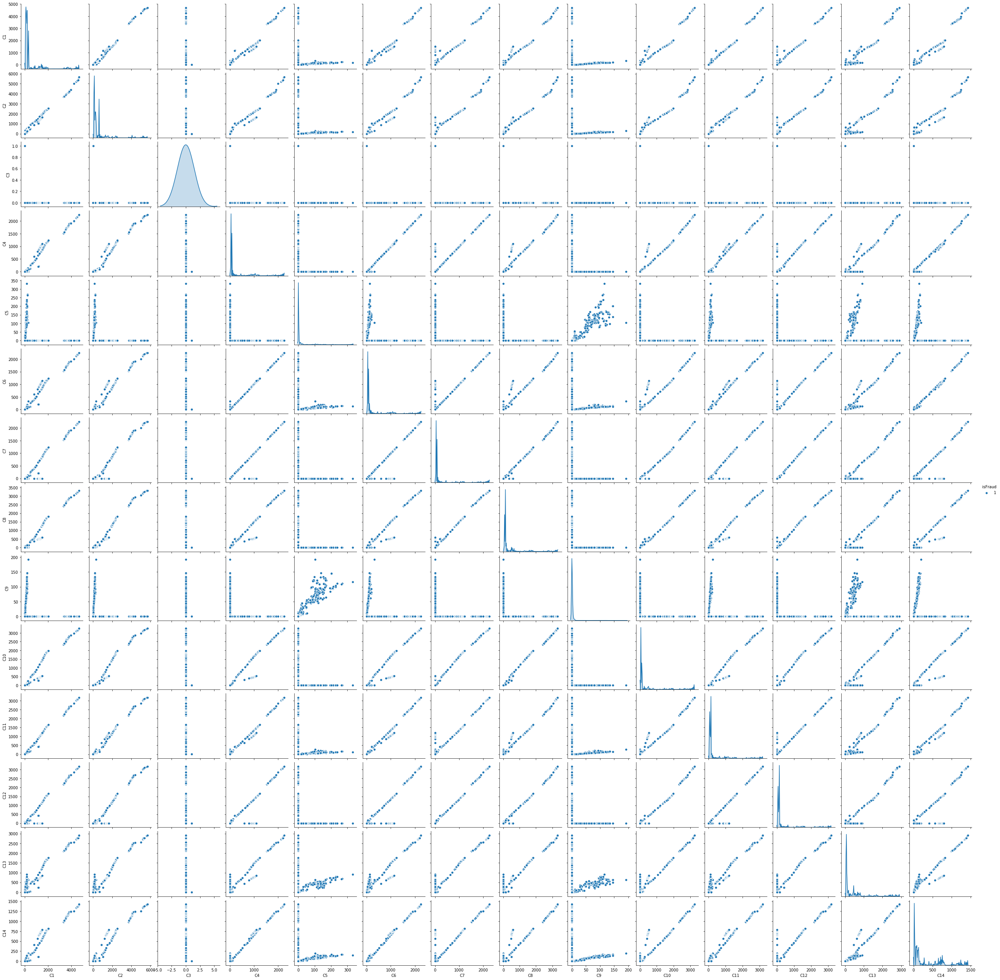

In [45]:
import seaborn as sns
sns.pairplot(train_transaction[train_transaction['isFraud']==1], vars = c_cols, dropna = True, hue = 'isFraud',diag_kws={'bw': 1.5})

In [46]:
#The reason i used pair plot is to check if there is any direct relationship between the card variables.

In [47]:
data_cols = [c for c in train_transaction.columns if c[0]=='D']
train_transaction[data_cols].head()

,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15
TransactionID,,,,,,,,,,,,,,,
2987000,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0
2987001,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0
2987002,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0
2987003,112.0,112.0,0.0,94.0,0.0,NaN,NaN,NaN,NaN,84.0,NaN,NaN,NaN,NaN,111.0
2987004,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


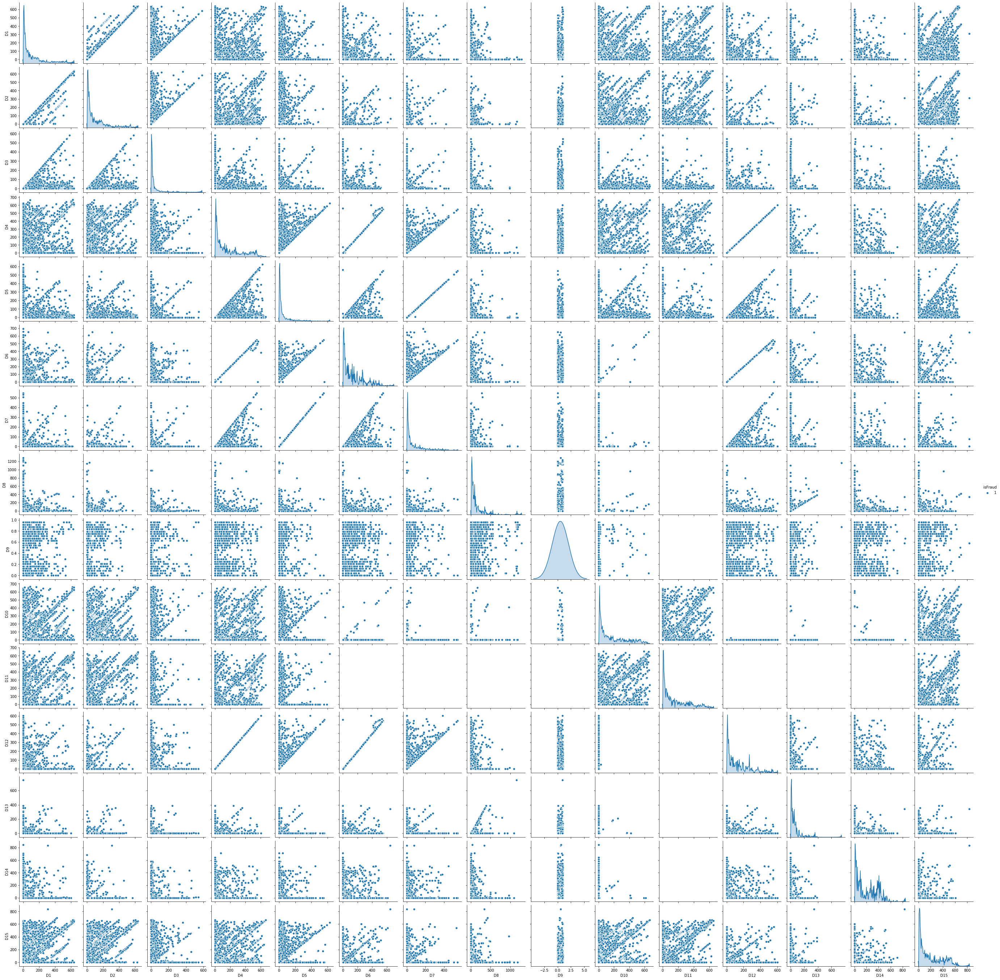

In [48]:
#The pairplot for the data cols D1 till rest
sns.pairplot(train_transaction[train_transaction['isFraud']==1], vars = data_cols, dropna = True, hue = 'isFraud',diag_kws={'bw': 1.5})

In [49]:
#pair plot for the data for M attributes

m_cols = [c for c in train_transaction if c[0] == 'M']
train_transaction[m_cols].head()

,M1,M2,M3,M4,M5,M6,M7,M8,M9
TransactionID,,,,,,,,,
2987000,T,T,T,M2,F,T,NaN,NaN,NaN
2987001,NaN,NaN,NaN,M0,T,T,NaN,NaN,NaN
2987002,T,T,T,M0,F,F,F,F,F
2987003,NaN,NaN,NaN,M0,T,F,NaN,NaN,NaN
2987004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


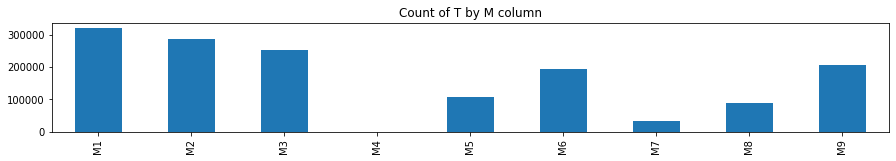

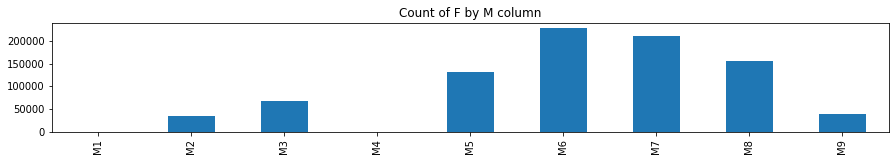

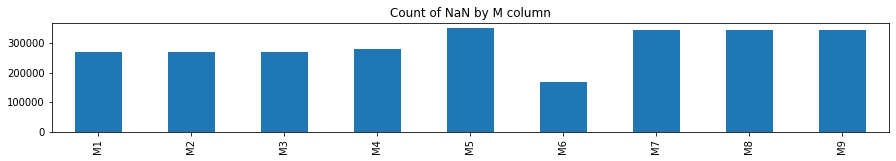

In [50]:
(train_transaction[m_cols] == 'T').sum().plot(kind='bar',
                                              title='Count of T by M column',
                                              figsize=(15, 2)
                                              )
plt.show()
(train_transaction[m_cols] == 'F').sum().plot(kind='bar',
                                              title='Count of F by M column',
                                              figsize=(15, 2)
                                              )
plt.show()
(train_transaction[m_cols].isna()).sum().plot(kind='bar',
                                              title='Count of NaN by M column',
                                              figsize=(15, 2)
                                    )
plt.show()

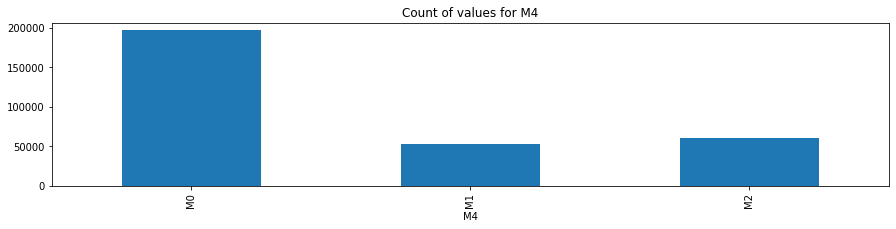

In [51]:
train_transaction.groupby('M4')['M4'].count().plot(kind='bar',title='Count of values for M4',figsize=(15, 3))
plt.show()

In [52]:
v_cols = [c for c in train_transaction if c[0] == 'V']
train_transaction[v_cols].head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
TransactionID,,,,,,,,,,,,,,,,,,,,,
2987000,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987002,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [53]:
train_transaction['v_mean'] = train_transaction[v_cols].mean(axis=1)

In [54]:
plt.clf()
plt.close()

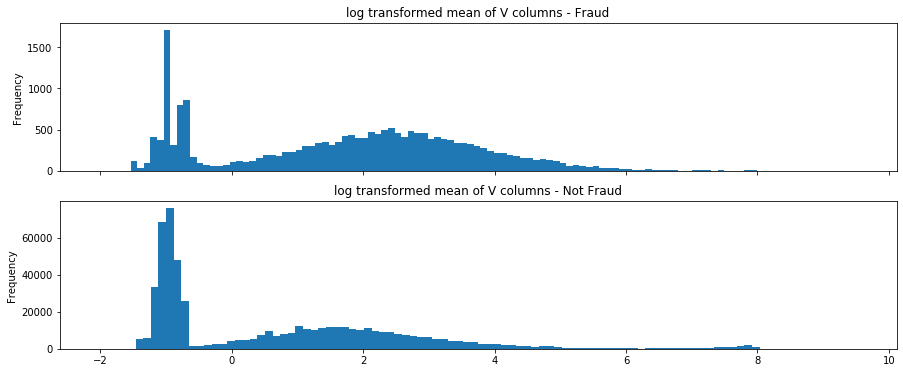

In [55]:
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(15, 6))
train_transaction.loc[train_transaction['isFraud'] == 1]['v_mean'] \
    .apply(np.log) \
    .plot(kind='hist',
          bins=100,
          title='log transformed mean of V columns - Fraud',
          ax=ax1)
train_transaction.loc[train_transaction['isFraud'] == 0]['v_mean'] \
    .apply(np.log) \
    .plot(kind='hist',
          bins=100,
          title='log transformed mean of V columns - Not Fraud',
          ax=ax2)
plt.show()

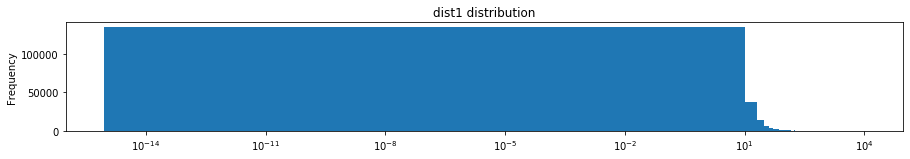

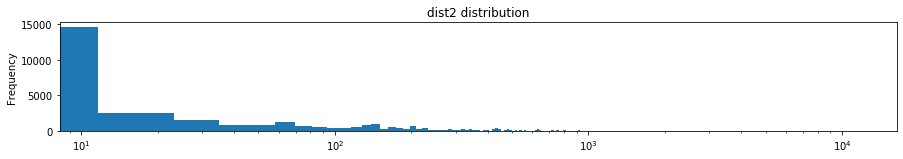

In [56]:
#Ref-> Mohit's EDA 
train_transaction['dist1'].plot(kind='hist',
                                bins=1000,
                                figsize=(15, 2),
                                title='dist1 distribution',
                                logx=True)
plt.show()
train_transaction['dist2'].plot(kind='hist',
                                bins=1000,
                                figsize=(15, 2),
                                title='dist2 distribution',
                                logx=True)
plt.show()

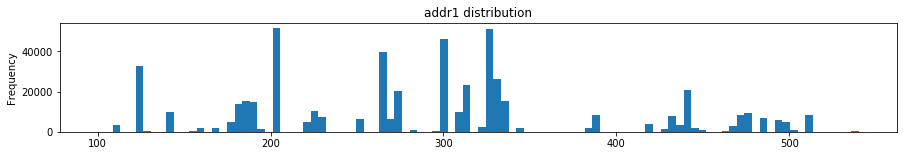

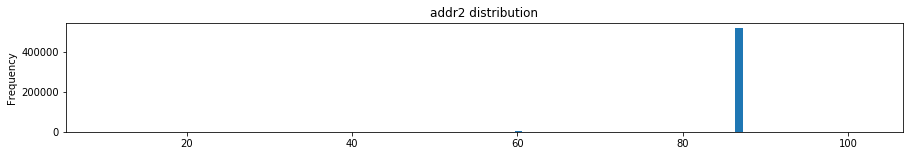

In [57]:
train_transaction['addr1'].plot(kind='hist', bins=100, figsize=(15, 2), title='addr1 distribution')
plt.show()
train_transaction['addr2'].plot(kind='hist', bins=100, figsize=(15, 2), title='addr2 distribution')
plt.show()

In [58]:
#from this point forward we will do the EDA for the second data set which is identity data.


train_identity.head()

,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
TransactionID,,,,,,,,,,,,,,,,,,,,,
2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,NaN,...,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device
2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,Windows
2987011,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,NaN,NaN,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,NaN
2987016,0.0,7460.0,0.0,0.0,1.0,0.0,NaN,NaN,0.0,0.0,...,chrome 62.0,24.0,1280x800,match_status:2,T,F,T,T,desktop,MacOS


In [59]:
train_identity.describe()

,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,...,id_17,id_18,id_19,id_20,id_21,id_22,id_24,id_25,id_26,id_32
count,144233.000000,140872.000000,66324.000000,66324.000000,136865.000000,136865.000000,5155.000000,5155.000000,74926.000000,74926.000000,...,139369.000000,45113.000000,139318.000000,139261.000000,5159.000000,5169.000000,4747.000000,5132.000000,5163.000000,77586.000000
mean,-10.170502,174716.584708,0.060189,-0.058938,1.615585,-6.698710,13.285354,-38.600388,0.091023,-0.301124,...,189.451377,14.237337,353.128174,403.882666,368.269820,16.002708,12.800927,329.608924,149.070308,26.508597
std,14.347949,159651.816856,0.598231,0.701015,5.249856,16.491104,11.384207,26.084899,0.983842,2.789446,...,30.375360,1.561302,141.095343,152.160327,198.847038,6.897665,2.372447,97.461089,32.101995,3.737502
min,-100.000000,1.000000,-13.000000,-28.000000,-72.000000,-100.000000,-46.000000,-100.000000,-36.000000,-100.000000,...,100.000000,10.000000,100.000000,100.000000,100.000000,10.000000,11.000000,100.000000,100.000000,0.000000
25%,-10.000000,67992.000000,0.000000,0.000000,0.000000,-6.000000,5.000000,-48.000000,0.000000,0.000000,...,166.000000,13.000000,266.000000,256.000000,252.000000,14.000000,11.000000,321.000000,119.000000,24.000000
50%,-5.000000,125800.500000,0.000000,0.000000,0.000000,0.000000,14.000000,-34.000000,0.000000,0.000000,...,166.000000,15.000000,341.000000,472.000000,252.000000,14.000000,11.000000,321.000000,149.000000,24.000000
75%,-5.000000,228749.000000,0.000000,0.000000,1.000000,0.000000,22.000000,-23.000000,0.000000,0.000000,...,225.000000,15.000000,427.000000,533.000000,486.500000,14.000000,15.000000,371.000000,169.000000,32.000000
max,0.000000,999595.000000,10.000000,0.000000,52.000000,0.000000,61.000000,0.000000,25.000000,0.000000,...,229.000000,29.000000,671.000000,661.000000,854.000000,44.000000,26.000000,548.000000,216.000000,32.000000


In [60]:
train_identity.columns

Index(['id_01', 'id_02', 'id_03', 'id_04', 'id_05', 'id_06', 'id_07', 'id_08',
       'id_09', 'id_10', 'id_11', 'id_12', 'id_13', 'id_14', 'id_15', 'id_16',
       'id_17', 'id_18', 'id_19', 'id_20', 'id_21', 'id_22', 'id_23', 'id_24',
       'id_25', 'id_26', 'id_27', 'id_28', 'id_29', 'id_30', 'id_31', 'id_32',
       'id_33', 'id_34', 'id_35', 'id_36', 'id_37', 'id_38', 'DeviceType',
       'DeviceInfo'],
      dtype='object')

In [61]:
#now since we have the same index for both the data sets hence

#get the index for the fraud transactions
index_val = train_transaction['isFraud'].index

In [62]:
#now filter based on the said index for the fraud transactions
identity_fraud = train_identity[train_identity.index.isin(index_val)]

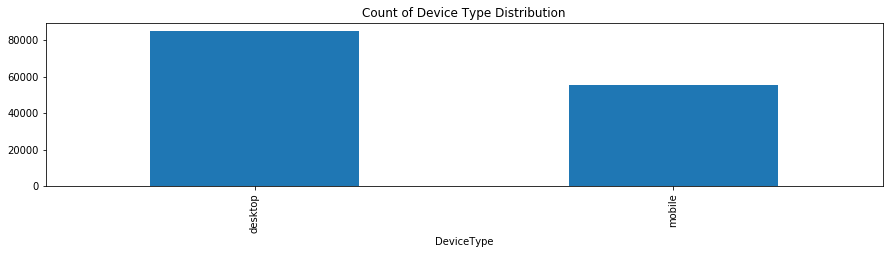

In [63]:
#Checking the distribution for device type first
#train_transaction.groupby('M4')['M4'].count().plot(kind='bar',title='Count of values for M4',figsize=(15, 3))
identity_fraud.groupby('DeviceType')['DeviceType'].count().plot(kind='bar',title='Count of Device Type Distribution',figsize=(15, 3))

In [64]:
identity_fraud.groupby('DeviceInfo')['DeviceInfo'].count().sort_values()

DeviceInfo
0PAJ5                     1
N9560 Build/NMF26F        1
NX16A8116KP               1
NX785QC8G                 1
NXA116QC164               1
                      ...  
rv:11.0                1901
Trident/7.0            7440
MacOS                 12573
iOS Device            19782
Windows               47722
Name: DeviceInfo, Length: 1786, dtype: int64

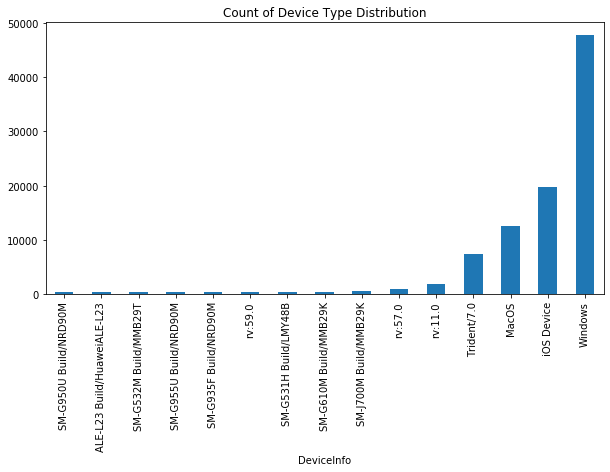

In [65]:
#since the number of parameter are huge hence checked via trial and error
identity_fraud.groupby('DeviceInfo')['DeviceInfo'].count().sort_values().tail(15).plot(kind='bar',title='Count of Device Type Distribution',figsize=(10, 5))

In [66]:
#since the numbers are huge hence checking if taking log helps the situation


In [67]:
#this is not useful since the values are being consistent
#te.apply(np.log).tail(90).plot(kind='bar',title='Count of Device Type Distribution',figsize=(50, 5))


In [68]:
#for the identity set we are also left with the identity columns
test_identity.head()

,id-01,id-02,id-03,id-04,id-05,id-06,id-07,id-08,id-09,id-10,...,id-31,id-32,id-33,id-34,id-35,id-36,id-37,id-38,DeviceType,DeviceInfo
TransactionID,,,,,,,,,,,,,,,,,,,,,
3663586,-45.0,280290.0,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,...,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,MYA-L13 Build/HUAWEIMYA-L13
3663588,0.0,3579.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,...,chrome 67.0 for android,24.0,1280x720,match_status:2,T,F,T,T,mobile,LGLS676 Build/MXB48T
3663597,-5.0,185210.0,NaN,NaN,1.0,0.0,NaN,NaN,NaN,NaN,...,ie 11.0 for tablet,NaN,NaN,NaN,F,T,T,F,desktop,Trident/7.0
3663601,-45.0,252944.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,...,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,MYA-L13 Build/HUAWEIMYA-L13
3663602,-95.0,328680.0,NaN,NaN,7.0,-33.0,NaN,NaN,NaN,NaN,...,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,SM-G9650 Build/R16NW


In [69]:
#check pariwise analysis of the identity object
id_cols = [c for c in identity_fraud.columns if c[0]=='i']
identity_fraud[id_cols].head()

,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,...,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38
TransactionID,,,,,,,,,,,,,,,,,,,,,
2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NotFound,Android 7.0,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T
2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,NaN,...,NotFound,iOS 11.1.2,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T
2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,...,Found,NaN,chrome 62.0,NaN,NaN,NaN,F,F,T,T
2987011,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,NaN,NaN,...,NotFound,NaN,chrome 62.0,NaN,NaN,NaN,F,F,T,T
2987016,0.0,7460.0,0.0,0.0,1.0,0.0,NaN,NaN,0.0,0.0,...,Found,Mac OS X 10_11_6,chrome 62.0,24.0,1280x800,match_status:2,T,F,T,T


In [70]:
#The pairplot for the identity data

#sns.pairplot(identity_fraud[train_transaction['isFraud']==1], vars = data_cols, dropna = True, hue = 'isFraud')
#this did not prove to be useful feature for the data analysis

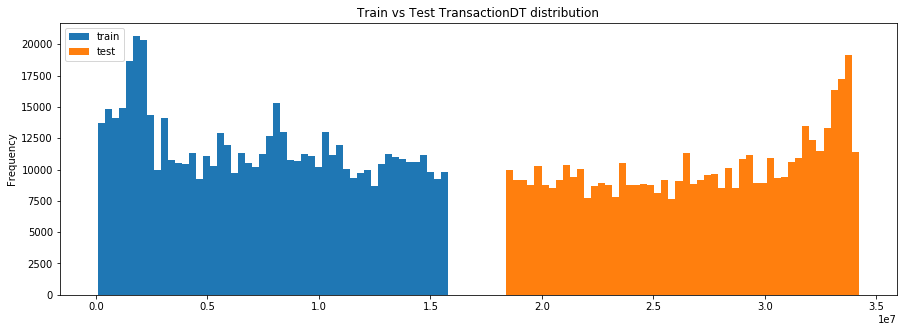

In [71]:
#it is important to note that there could be an underlying important feature over the TransactionDT.
#As shared by Mohit's EDA on the transaction identity info

#This is one of the most important views since it depicts the demarcation of transactions and the independence of train and test data.
train_transaction['TransactionDT'].plot(kind='hist',
                                        figsize=(15, 5),
                                        label='train',
                                        bins=50,
                                        title='Train vs Test TransactionDT distribution')
test_transaction['TransactionDT'].plot(kind='hist',
                                       label='test',
                                       bins=50)
plt.legend()
plt.show()

In [72]:
#furthering on this work checking the same patterns occur while corelating test and train data for the the identities over TransactionDT

id_cols = [c for c in identity_fraud.columns if c[0]=='i']

identity_fraud[id_cols].head()


,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,...,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38
TransactionID,,,,,,,,,,,,,,,,,,,,,
2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NotFound,Android 7.0,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T
2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,NaN,...,NotFound,iOS 11.1.2,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T
2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,...,Found,NaN,chrome 62.0,NaN,NaN,NaN,F,F,T,T
2987011,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,NaN,NaN,...,NotFound,NaN,chrome 62.0,NaN,NaN,NaN,F,F,T,T
2987016,0.0,7460.0,0.0,0.0,1.0,0.0,NaN,NaN,0.0,0.0,...,Found,Mac OS X 10_11_6,chrome 62.0,24.0,1280x800,match_status:2,T,F,T,T


In [73]:
id_time = [*train_transaction['TransactionDT']]


In [74]:
len(id_time)

590540

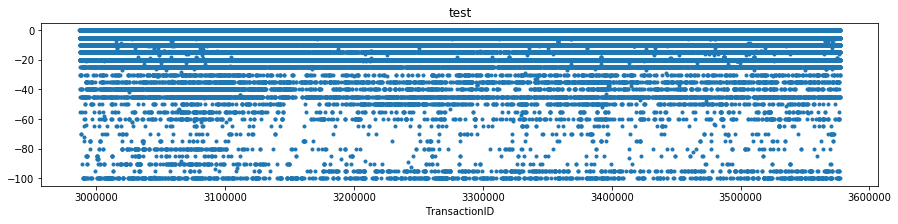

In [75]:
#this is not correct since the data is indexed for the transaction id.
identity_fraud['id_01'].plot(style='.', title="test", figsize=(15, 3))

#we will have to re-index it on the TransactionDT


In [76]:
#Query - >How best to accomplisth this ?
#Where is TransactionDT ? in the train_transaction data ?

copy_transaction = train_transaction.copy()


In [77]:
copy_transaction.head()

,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,V331,V332,V333,V334,V335,V336,V337,V338,V339,v_mean
TransactionID,,,,,,,,,,,,,,,,,,,,,
2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.271605
2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.313609
2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.388889
2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,66.573964
2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,credit,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,799.648111


In [78]:
copy_transaction.set_index('TransactionDT')

,isFraud,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,...,V331,V332,V333,V334,V335,V336,V337,V338,V339,v_mean
TransactionDT,,,,,,,,,,,,,,,,,,,,,
86400,0,68.50,W,13926,NaN,150.0,discover,142.0,credit,315.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.271605
86401,0,29.00,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.313609
86469,0,59.00,W,4663,490.0,150.0,visa,166.0,debit,330.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.388889
86499,0,50.00,W,18132,567.0,150.0,mastercard,117.0,debit,476.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,66.573964
86506,0,50.00,H,4497,514.0,150.0,mastercard,102.0,credit,420.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,799.648111
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15811047,0,49.00,W,6550,NaN,150.0,visa,226.0,debit,272.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.491667
15811049,0,39.50,W,10444,225.0,150.0,mastercard,224.0,debit,204.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.388889
15811079,0,30.95,W,12037,595.0,150.0,mastercard,224.0,debit,231.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.444444


In [79]:
#doing the same for the identity 
identity_fraud[id_cols].head()

,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,...,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38
TransactionID,,,,,,,,,,,,,,,,,,,,,
2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NotFound,Android 7.0,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T
2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,NaN,...,NotFound,iOS 11.1.2,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T
2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,...,Found,NaN,chrome 62.0,NaN,NaN,NaN,F,F,T,T
2987011,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,NaN,NaN,...,NotFound,NaN,chrome 62.0,NaN,NaN,NaN,F,F,T,T
2987016,0.0,7460.0,0.0,0.0,1.0,0.0,NaN,NaN,0.0,0.0,...,Found,Mac OS X 10_11_6,chrome 62.0,24.0,1280x800,match_status:2,T,F,T,T


In [80]:
train_identity_ = train_identity.merge(train_transaction[['TransactionDT',
                                                         'isFraud']],on=['TransactionID'])


In [81]:
train_identity_.head()

train_identity_

,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,...,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,TransactionDT,isFraud
TransactionID,,,,,,,,,,,,,,,,,,,,,
2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M,86506,0
2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,NaN,...,1334x750,match_status:1,T,F,F,T,mobile,iOS Device,86535,0
2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,...,NaN,NaN,F,F,T,T,desktop,Windows,86549,0
2987011,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,NaN,NaN,...,NaN,NaN,F,F,T,T,desktop,NaN,86555,0
2987016,0.0,7460.0,0.0,0.0,1.0,0.0,NaN,NaN,0.0,0.0,...,1280x800,match_status:2,T,F,T,T,desktop,MacOS,86620,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3577521,-15.0,145955.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,...,NaN,NaN,F,F,T,F,mobile,F3111 Build/33.3.A.1.97,15810802,0
3577526,-5.0,172059.0,NaN,NaN,1.0,-5.0,NaN,NaN,NaN,NaN,...,855x480,match_status:2,T,F,T,F,mobile,A574BL Build/NMF26F,15810876,1
3577529,-20.0,632381.0,NaN,NaN,-1.0,-36.0,NaN,NaN,NaN,NaN,...,NaN,NaN,F,F,T,F,mobile,Moto E (4) Plus Build/NMA26.42-152,15810912,0


In [82]:
test_identity_ = test_identity.merge(test_transaction['TransactionDT'],
                                    on=['TransactionID'])

In [83]:
test_identity_.head()

,id-01,id-02,id-03,id-04,id-05,id-06,id-07,id-08,id-09,id-10,...,id-32,id-33,id-34,id-35,id-36,id-37,id-38,DeviceType,DeviceInfo,TransactionDT
TransactionID,,,,,,,,,,,,,,,,,,,,,
3663586,-45.0,280290.0,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,F,F,T,F,mobile,MYA-L13 Build/HUAWEIMYA-L13,18404013
3663588,0.0,3579.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,...,24.0,1280x720,match_status:2,T,F,T,T,mobile,LGLS676 Build/MXB48T,18404055
3663597,-5.0,185210.0,NaN,NaN,1.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,F,T,T,F,desktop,Trident/7.0,18404235
3663601,-45.0,252944.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,...,NaN,NaN,NaN,F,F,T,F,mobile,MYA-L13 Build/HUAWEIMYA-L13,18404315
3663602,-95.0,328680.0,NaN,NaN,7.0,-33.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,F,F,T,F,mobile,SM-G9650 Build/R16NW,18404359


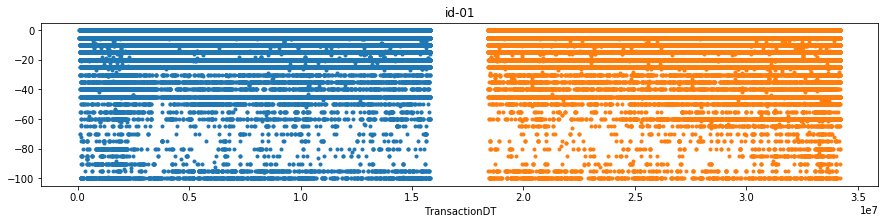

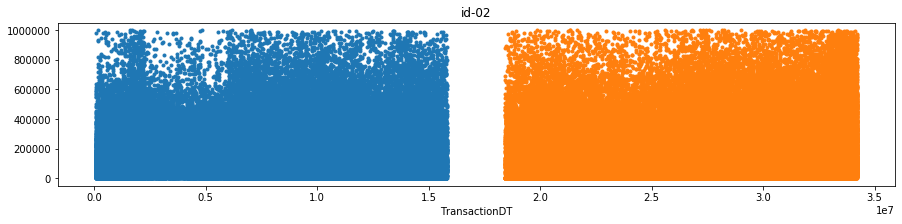

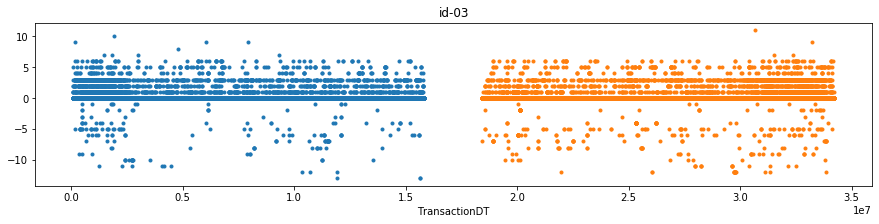

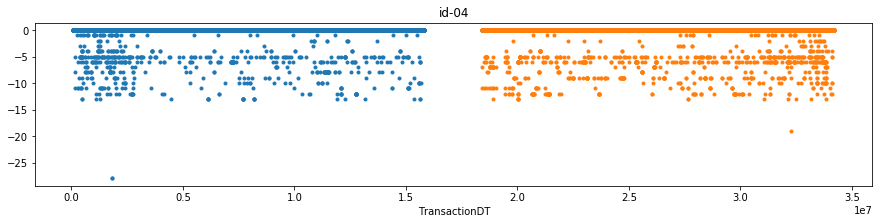

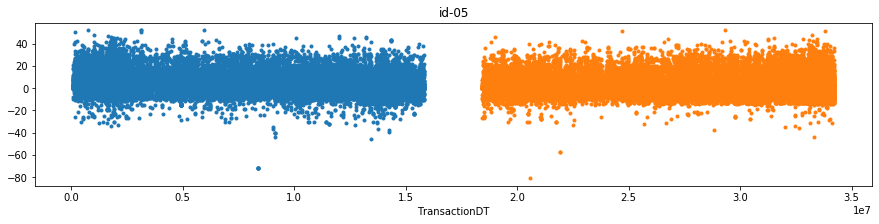

...

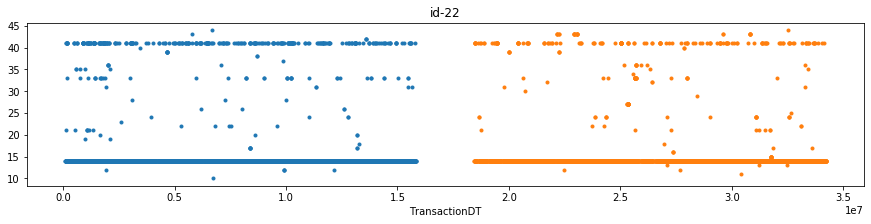

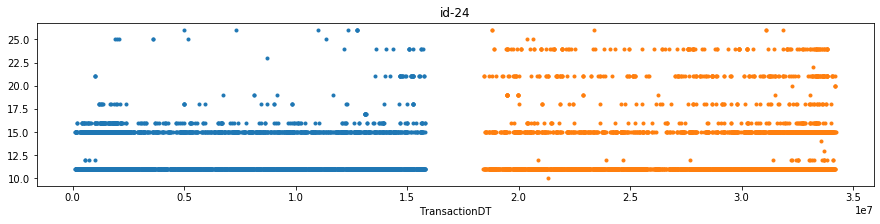

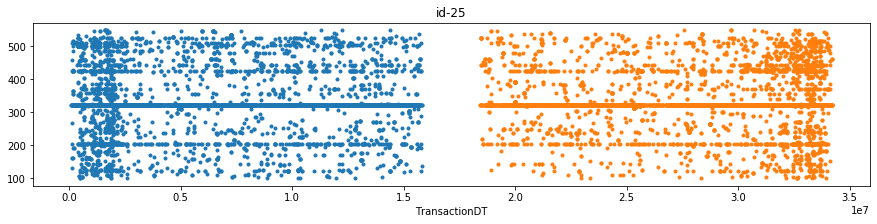

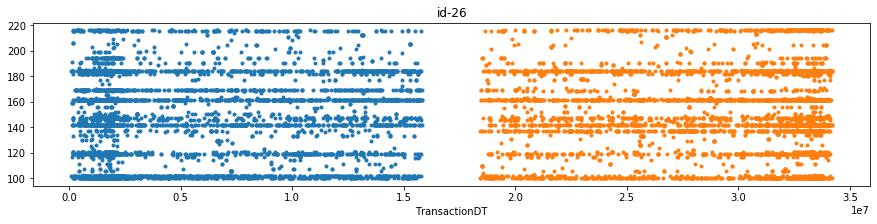

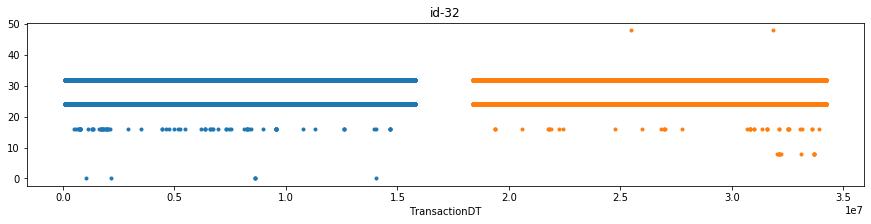

In [84]:
id_cols = [c for c in identity_fraud.columns if 'id' in c]

for i in id_cols:
    try:
        train_identity_.set_index('TransactionDT')[i].plot(style='.', title=i, figsize=(15, 3))
        j= i.replace('_','-')

        test_identity_.set_index('TransactionDT')[j].plot(style='.', title=j, figsize=(15, 3))
        plt.show()
    except TypeError:
        pass

In [85]:
#in the above graph there is a surprising direct relationship between transactionDT and few parameters of the graph

#hence checking for other parameters as well


In [86]:
[*train_transaction.columns]

['isFraud',
 'TransactionDT',
 'TransactionAmt',
 'ProductCD',
 'card1',
 'card2',
 'card3',
 'card4',
 'card5',
 'card6',
 'addr1',
 'addr2',
 'dist1',
 'dist2',
 'P_emaildomain',
 'R_emaildomain',
 'C1',
 'C2',
 'C3',
 'C4',
 'C5',
 'C6',
 'C7',
 'C8',
 'C9',
 'C10',
 'C11',
 'C12',
 'C13',
 'C14',
 'D1',
 'D2',
 'D3',
 'D4',
 'D5',
 'D6',
 'D7',
 'D8',
 'D9',
 'D10',
 'D11',
 'D12',
 'D13',
 'D14',
 'D15',
 'M1',
 'M2',
 'M3',
 'M4',
 'M5',
 'M6',
 'M7',
 'M8',
 'M9',
 'V1',
 'V2',
 'V3',
 'V4',
 'V5',
 'V6',
 'V7',
 'V8',
 'V9',
 'V10',
 'V11',
 'V12',
 'V13',
 'V14',
 'V15',
 'V16',
 'V17',
 'V18',
 'V19',
 'V20',
 'V21',
 'V22',
 'V23',
 'V24',
 'V25',
 'V26',
 'V27',
 'V28',
 'V29',
 'V30',
 'V31',
 'V32',
 'V33',
 'V34',
 'V35',
 'V36',
 'V37',
 'V38',
 'V39',
 'V40',
 'V41',
 'V42',
 'V43',
 'V44',
 'V45',
 'V46',
 'V47',
 'V48',
 'V49',
 'V50',
 'V51',
 'V52',
 'V53',
 'V54',
 'V55',
 'V56',
 'V57',
 'V58',
 'V59',
 'V60',
 'V61',
 'V62',
 'V63',
 'V64',
 'V65',
 'V66',
 'V67

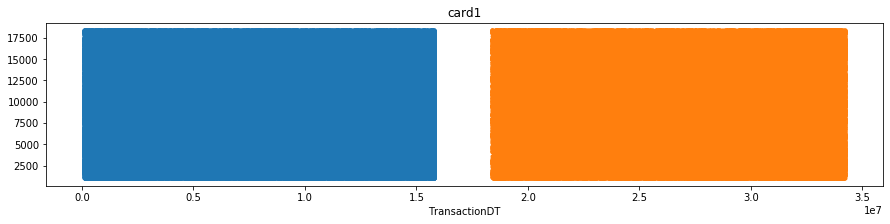

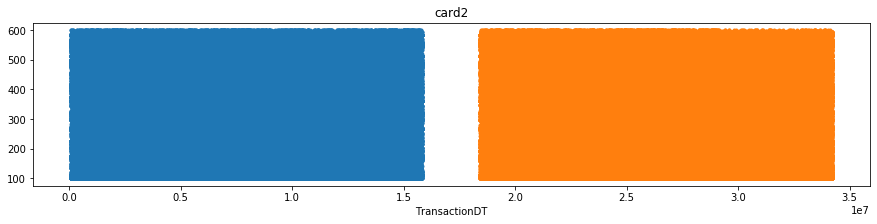

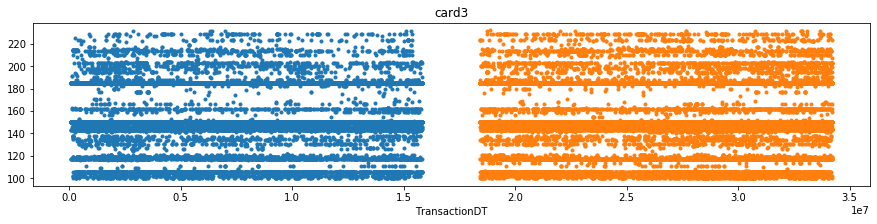

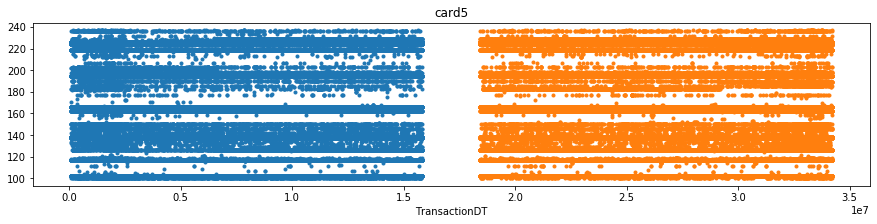

In [87]:
id_cols = ['card1',
 'card2',
 'card3',
 'card4',
 'card5',
 'card6',]

for i in id_cols:
    try:
        train_transaction.set_index('TransactionDT')[i].plot(style='.', title=i, figsize=(15, 3))
        #j= i.replace('_','-')

        test_transaction.set_index('TransactionDT')[i].plot(style='.', title=i, figsize=(15, 3))
        plt.show()
    except TypeError:
        pass

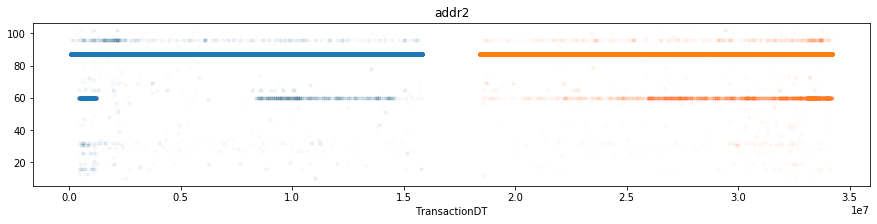

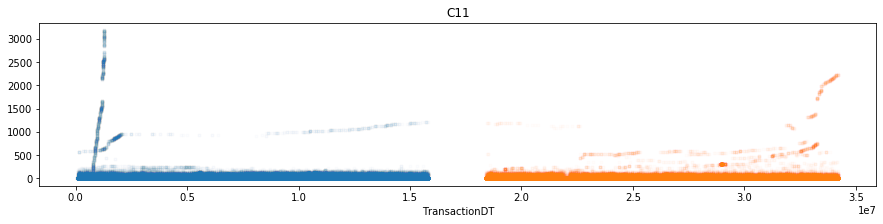

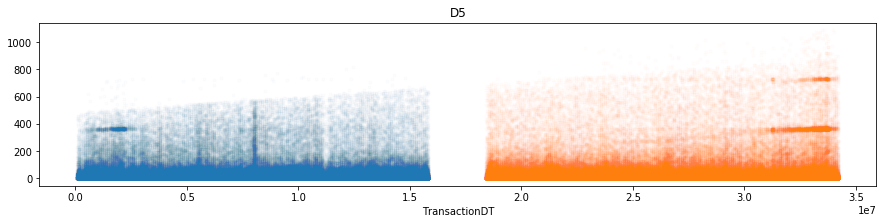

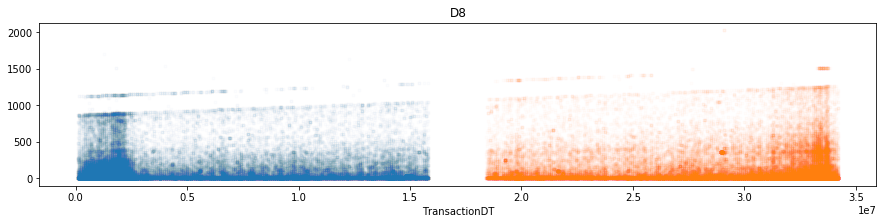

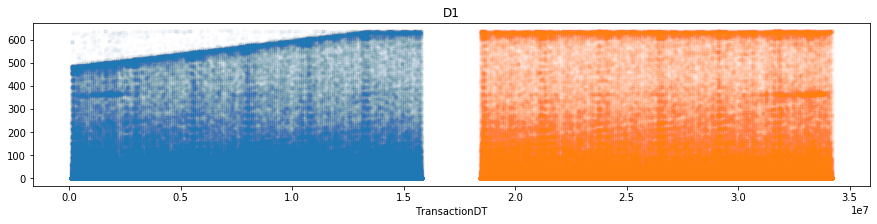

...

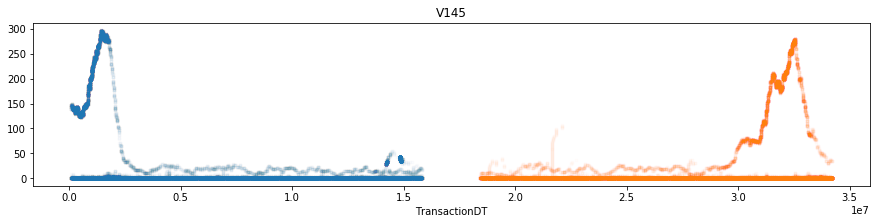

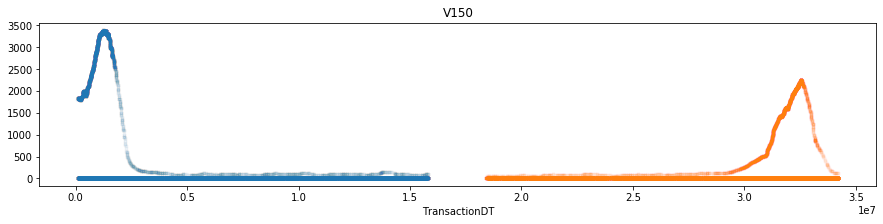

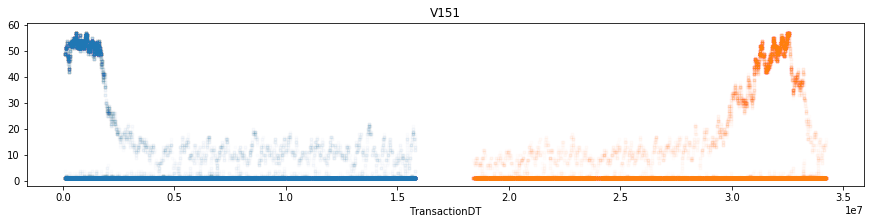

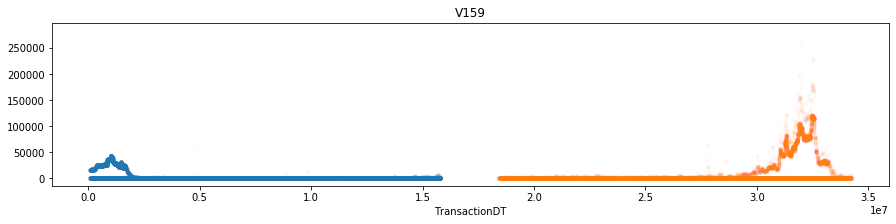

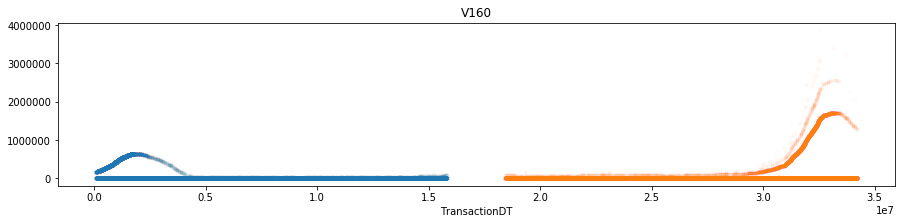

In [88]:
for c in ['addr2','C11','D5','D8','D1','D15','V144','V145','V150','V151','V159','V160']:
    try:
        train_transaction.set_index('TransactionDT')[c].plot(style='.', title=c, figsize=(15, 3), alpha=0.01)
        test_transaction.set_index('TransactionDT')[c].plot(style='.', title=c, figsize=(15, 3), alpha=0.01)
        plt.show()
    except TypeError:
        pass
    except KeyError:
        pass

In [89]:
#usama
#cleaning the NaN values
#combine the train trans and identity
#read the datasets again to make sure we have a clean dataset
#making TransactionID index

train_transaction = pd.read_csv('ieee-fraud-detection/train_transaction.csv', index_col='TransactionID')
train_identity = pd.read_csv('ieee-fraud-detection/train_identity.csv',index_col='TransactionID')

print(list(train_transaction.columns))
print(train_transaction.index)

['isFraud', 'TransactionDT', 'TransactionAmt', 'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6', 'addr1', 'addr2', 'dist1', 'dist2', 'P_emaildomain', 'R_emaildomain', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84'

In [90]:
#checking all the columns of train identity dataset and its index
print(list(train_identity.columns))
print(train_identity.index)

['id_01', 'id_02', 'id_03', 'id_04', 'id_05', 'id_06', 'id_07', 'id_08', 'id_09', 'id_10', 'id_11', 'id_12', 'id_13', 'id_14', 'id_15', 'id_16', 'id_17', 'id_18', 'id_19', 'id_20', 'id_21', 'id_22', 'id_23', 'id_24', 'id_25', 'id_26', 'id_27', 'id_28', 'id_29', 'id_30', 'id_31', 'id_32', 'id_33', 'id_34', 'id_35', 'id_36', 'id_37', 'id_38', 'DeviceType', 'DeviceInfo']
Int64Index([2987004, 2987008, 2987010, 2987011, 2987016, 2987017, 2987022,
            2987038, 2987040, 2987048,
            ...
            3577495, 3577499, 3577501, 3577506, 3577509, 3577521, 3577526,
            3577529, 3577531, 3577534],
           dtype='int64', name='TransactionID', length=144233)


In [91]:
#combine both trans and identity
#df_final = pd.merge(left=train_transaction,right=train_identity,on="TransactionID",how="outer")

df_final = train_transaction.merge(train_identity,
                                    on=['TransactionID'],how="outer")
print(df_final.head())
print(list(df_final.columns))

               isFraud  TransactionDT  TransactionAmt ProductCD  card1  card2  \
TransactionID                                                                   
2987000              0          86400            68.5         W  13926    NaN   
2987001              0          86401            29.0         W   2755  404.0   
2987002              0          86469            59.0         W   4663  490.0   
2987003              0          86499            50.0         W  18132  567.0   
2987004              0          86506            50.0         H   4497  514.0   

               card3       card4  card5   card6  ...                id_31  \
TransactionID                                    ...                        
2987000        150.0    discover  142.0  credit  ...                  NaN   
2987001        150.0  mastercard  102.0  credit  ...                  NaN   
2987002        150.0        visa  166.0   debit  ...                  NaN   
2987003        150.0  mastercard  117.0   debit

In [92]:
#check no of null values per column
print(df_final.isna().sum())

isFraud                0
TransactionDT          0
TransactionAmt         0
ProductCD              0
card1                  0
                   ...  
id_36             449555
id_37             449555
id_38             449555
DeviceType        449730
DeviceInfo        471874
Length: 433, dtype: int64


In [94]:
#count the number of NaN values per column
#find the total number of rows for every column

df_final_sum_of_null_values = df_final.isna().sum()
df_final_no_of_rows = df_final['TransactionDT'].count()
print(df_final_no_of_rows)

590540


In [95]:
#find percentage of null values per column
per_df_final_null_values = (df_final_sum_of_null_values / df_final_no_of_rows) * 100

In [96]:
#display the percentage of null values per column
print(list(per_df_final_null_values))
print(per_df_final_null_values.max())

[0.0, 0.0, 0.0, 0.0, 0.0, 1.5126833068039423, 0.26501168422122123, 0.267043722694483, 0.7212043214684865, 0.26602770345785215, 11.12642666034477, 11.12642666034477, 59.6523520845328, 93.62837403054831, 15.99485216920107, 76.75161716395164, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.21488806854743114, 47.54919226470688, 44.514850814508755, 28.60466691502693, 52.4674027161581, 87.60676668811597, 93.40992989467267, 87.31229044603245, 87.31229044603245, 12.873302401192129, 47.29349409015477, 89.04104717715988, 89.50926270870728, 89.46946862193924, 15.09008703898127, 45.90713584177194, 45.90713584177194, 45.90713584177194, 47.658753005723575, 59.34940901547736, 28.678836319300977, 58.63531682866528, 58.633115453652586, 58.633115453652586, 47.29349409015477, 47.29349409015477, 47.29349409015477, 47.29349409015477, 47.29349409015477, 47.29349409015477, 47.29349409015477, 47.29349409015477, 47.29349409015477, 47.29349409015477, 47.29349409015477, 12.881938564703491

In [97]:
#find columns with more than 90% null values
print(per_df_final_null_values[per_df_final_null_values >= 90])
col_list_to_drop = dict(per_df_final_null_values[per_df_final_null_values >= 90]).keys()
print(col_list_to_drop)

dist2    93.628374
D7       93.409930
id_07    99.127070
id_08    99.127070
id_18    92.360721
id_21    99.126393
id_22    99.124699
id_23    99.124699
id_24    99.196159
id_25    99.130965
id_26    99.125715
id_27    99.124699
dtype: float64
dict_keys(['dist2', 'D7', 'id_07', 'id_08', 'id_18', 'id_21', 'id_22', 'id_23', 'id_24', 'id_25', 'id_26', 'id_27'])


In [98]:
#drop the columns with more than 90% null values
for i in col_list_to_drop:
    df_final.drop(i,axis=1,inplace=True)

print(list(df_final.columns))

['isFraud', 'TransactionDT', 'TransactionAmt', 'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6', 'addr1', 'addr2', 'dist1', 'P_emaildomain', 'R_emaildomain', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V86',

In [99]:
#checking null values per column after droping the columns
print(list(df_final.isna().sum()))

[0, 0, 0, 0, 0, 8933, 1565, 1577, 4259, 1571, 65706, 65706, 352271, 94456, 453249, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1269, 280797, 262878, 168922, 309841, 517353, 515614, 515614, 76022, 279287, 525823, 528588, 528353, 89113, 271100, 271100, 271100, 281444, 350482, 169360, 346265, 346252, 346252, 279287, 279287, 279287, 279287, 279287, 279287, 279287, 279287, 279287, 279287, 279287, 76073, 76073, 76073, 76073, 76073, 76073, 76073, 76073, 76073, 76073, 76073, 76073, 76073, 76073, 76073, 76073, 76073, 76073, 76073, 76073, 76073, 76073, 76073, 168969, 168969, 168969, 168969, 168969, 168969, 168969, 168969, 168969, 168969, 168969, 168969, 168969, 168969, 168969, 168969, 168969, 168969, 77096, 77096, 77096, 77096, 77096, 77096, 77096, 77096, 77096, 77096, 77096, 77096, 77096, 77096, 77096, 77096, 77096, 77096, 77096, 77096, 77096, 77096, 89164, 89164, 89164, 89164, 89164, 89164, 89164, 89164, 89164, 89164, 89164, 89164, 89164, 89164, 89164, 89164, 89164, 89164, 89164, 89164, 314, 314

In [100]:
#finding the columns with null values.
#that means find the columns whose count of null values != 0
#finding this so that we know which columns we need to process for null values
print(list(df_final.columns))
df_final_sum_of_null_values = df_final.isna().sum()
df_final_no_of_rows = df_final['TransactionDT'].count()
print(df_final_no_of_rows)
#find percentage of null values per column
per_df_final_null_values = (df_final_sum_of_null_values / df_final_no_of_rows) * 100

Non_zero_columns = list(dict(per_df_final_null_values[per_df_final_null_values != 0]).keys())
print(Non_zero_columns)

['isFraud', 'TransactionDT', 'TransactionAmt', 'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6', 'addr1', 'addr2', 'dist1', 'P_emaildomain', 'R_emaildomain', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V86',

In [101]:
#fill null values for ['card2,card3,card5'] by mean values
for i in ['card2','card3','card5']:
    print(df_final[i].isna().sum())
    df_final[i].fillna(df_final[i].mean(),inplace=True)
    print(df_final[i].isna().sum())


8933
0
1565
0
4259
0


In [102]:
#fill null values for ['card4,card6'] by mode values
for i in ['card4','card6']:
    print(df_final[i].isna().sum())
    df_final[i].fillna(df_final[i].mode()[0],inplace=True)
    print(df_final[i].isna().sum())

1577
0
1571
0


In [103]:
#find percentage of null values per column after removing null values of columns ['card2','card3','card4','card5','card6']
df_final_sum_of_null_values = df_final.isna().sum()
df_final_no_of_rows = df_final['TransactionDT'].count()
print(df_final_no_of_rows)
per_df_final_null_values = (df_final_sum_of_null_values / df_final_no_of_rows) * 100
print(per_df_final_null_values[per_df_final_null_values != 0])
col_list = dict(per_df_final_null_values[per_df_final_null_values != 0]).keys()
print(col_list)

590540
addr1            11.126427
addr2            11.126427
dist1            59.652352
P_emaildomain    15.994852
R_emaildomain    76.751617
                   ...    
id_36            76.126088
id_37            76.126088
id_38            76.126088
DeviceType       76.155722
DeviceInfo       79.905510
Length: 397, dtype: float64
dict_keys(['addr1', 'addr2', 'dist1', 'P_emaildomain', 'R_emaildomain', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66',

In [104]:
#preprocessing of null values for ['addr1','addr2','dist1']
col_list = ['addr1','addr2','dist1']

for i in col_list:
    print(df_final[i].isna().sum())
    print(df_final[i].value_counts(dropna=False))

65706
NaN      65706
299.0    46335
325.0    42751
204.0    42020
264.0    39870
         ...  
238.0        1
338.0        1
241.0        1
243.0        1
353.0        1
Name: addr1, Length: 333, dtype: int64
65706
87.0    520481
NaN      65706
60.0      3084
96.0       638
32.0        91
         ...  
22.0         1
25.0         1
75.0         1
49.0         1
77.0         1
Name: addr2, Length: 75, dtype: int64
352271
NaN       352271
0.0        19824
1.0        18330
2.0        17028
4.0        13067
           ...  
2621.0         1
2618.0         1
2613.0         1
2648.0         1
1633.0         1
Name: dist1, Length: 2652, dtype: int64


In [105]:
#preprocessing of null values for ['addr1','addr2','dist1']
for i in col_list:
    print(df_final[i].isna().sum())
    df_final[i].fillna(df_final[i].mean(),inplace=True)
    print(df_final[i].isna().sum())

65706
0
65706
0
352271
0


In [106]:
#find percentage of null values per column after removing null values from #preprocessing of null values for ['addr1','addr2','dist1']
df_final_sum_of_null_values = df_final.isna().sum()
df_final_no_of_rows = df_final['TransactionDT'].count()
print(df_final_no_of_rows)
per_df_final_null_values = (df_final_sum_of_null_values / df_final_no_of_rows) * 100
print(per_df_final_null_values[per_df_final_null_values != 0])
col_list = dict(per_df_final_null_values[per_df_final_null_values != 0]).keys()
print(col_list)

590540
P_emaildomain    15.994852
R_emaildomain    76.751617
D1                0.214888
D2               47.549192
D3               44.514851
                   ...    
id_36            76.126088
id_37            76.126088
id_38            76.126088
DeviceType       76.155722
DeviceInfo       79.905510
Length: 394, dtype: float64
dict_keys(['P_emaildomain', 'R_emaildomain', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70'

In [107]:
#making a new category of email_not_provided for both P_emaildomain,R_emaildomain to fill null values
email_not_provided = 'email_not_provided'
df_final['P_emaildomain'].fillna(email_not_provided,inplace=True)
print(df_final['P_emaildomain'].isna().sum())
df_final['R_emaildomain'].fillna(email_not_provided,inplace=True)
print(df_final['P_emaildomain'].isna().sum())

0
0


In [108]:
#find percentage of null values per column after null values preprocessing of P_emaildomain,R_emaildomain
df_final_sum_of_null_values = df_final.isna().sum()
df_final_no_of_rows = df_final['TransactionDT'].count()
print(df_final_no_of_rows)
per_df_final_null_values = (df_final_sum_of_null_values / df_final_no_of_rows) * 100
print(per_df_final_null_values[per_df_final_null_values != 0])
col_list = dict(per_df_final_null_values[per_df_final_null_values != 0]).keys()
print(col_list)

590540
D1             0.214888
D2            47.549192
D3            44.514851
D4            28.604667
D5            52.467403
                ...    
id_36         76.126088
id_37         76.126088
id_38         76.126088
DeviceType    76.155722
DeviceInfo    79.905510
Length: 392, dtype: float64
dict_keys(['D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V

In [109]:
#D7 is deleted cuz of 90% null values and this not included in the loop
#preprocessing of null values for ['D1','D2','D3','D4','D5','D6','D8','D9','D10','D11','D12','D13','D14','D15','D16']
#null values replaced with mean

for i in range(1,7):
    print(df_final['D'+str(i)].isna().sum())
    df_final['D'+str(i)].fillna(df_final['D'+str(i)].mean(),inplace=True)
    print(df_final['D'+str(i)].isna().sum())
    
for i in range(8,16):
    print(df_final['D'+str(i)].isna().sum())
    df_final['D'+str(i)].fillna(df_final['D'+str(i)].mean(),inplace=True)
    print(df_final['D'+str(i)].isna().sum())

1269
0
280797
0
262878
0
168922
0
309841
0
517353
0
515614
0
515614
0
76022
0
279287
0
525823
0
528588
0
528353
0
89113
0


In [110]:
#find percentage of null values per column after preprocessing of null values of D1,.....D15 except D7
df_final_sum_of_null_values = df_final.isna().sum()
df_final_no_of_rows = df_final['TransactionDT'].count()
print(df_final_no_of_rows)
per_df_final_null_values = (df_final_sum_of_null_values / df_final_no_of_rows) * 100
print(per_df_final_null_values[per_df_final_null_values != 0])
col_list = dict(per_df_final_null_values[per_df_final_null_values != 0]).keys()
print(col_list)

590540
M1            45.907136
M2            45.907136
M3            45.907136
M4            47.658753
M5            59.349409
                ...    
id_36         76.126088
id_37         76.126088
id_38         76.126088
DeviceType    76.155722
DeviceInfo    79.905510
Length: 378, dtype: float64
dict_keys(['M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V86', 'V87', 'V88', 'V89', 'V90', 'V91', 'V92', '

In [111]:
#preprocessing of M1....M9 null values with mode since these are categorical data
for i in range(1,10):
    print(df_final['M'+str(i)].isna().sum())
    df_final['M'+str(i)].fillna(df_final['M'+str(i)].mode()[0],inplace=True)
    print(df_final['M'+str(i)].isna().sum())

271100
0
271100
0
271100
0
281444
0
350482
0
169360
0
346265
0
346252
0
346252
0


In [112]:
#find percentage of null values per column after preprocessing of M1.......M9
df_final_sum_of_null_values = df_final.isna().sum()
df_final_no_of_rows = df_final['TransactionDT'].count()
print(df_final_no_of_rows)
per_df_final_null_values = (df_final_sum_of_null_values / df_final_no_of_rows) * 100
print(per_df_final_null_values[per_df_final_null_values != 0])
col_list = dict(per_df_final_null_values[per_df_final_null_values != 0]).keys()
print(col_list)

590540
V1            47.293494
V2            47.293494
V3            47.293494
V4            47.293494
V5            47.293494
                ...    
id_36         76.126088
id_37         76.126088
id_38         76.126088
DeviceType    76.155722
DeviceInfo    79.905510
Length: 369, dtype: float64
dict_keys(['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V86', 'V87', 'V88', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94', 'V95', 'V96', 'V97', 'V98', 'V99', 'V100'

In [113]:
#find percentage of null values per column and checking null values by making it a dictionary
df_final_sum_of_null_values = df_final.isna().sum()
df_final_no_of_rows = df_final['TransactionDT'].count()
print(df_final_no_of_rows)
per_df_final_null_values = (df_final_sum_of_null_values / df_final_no_of_rows) * 100
col_list = dict(per_df_final_null_values)
print(col_list)

590540
{'isFraud': 0.0, 'TransactionDT': 0.0, 'TransactionAmt': 0.0, 'ProductCD': 0.0, 'card1': 0.0, 'card2': 0.0, 'card3': 0.0, 'card4': 0.0, 'card5': 0.0, 'card6': 0.0, 'addr1': 0.0, 'addr2': 0.0, 'dist1': 0.0, 'P_emaildomain': 0.0, 'R_emaildomain': 0.0, 'C1': 0.0, 'C2': 0.0, 'C3': 0.0, 'C4': 0.0, 'C5': 0.0, 'C6': 0.0, 'C7': 0.0, 'C8': 0.0, 'C9': 0.0, 'C10': 0.0, 'C11': 0.0, 'C12': 0.0, 'C13': 0.0, 'C14': 0.0, 'D1': 0.0, 'D2': 0.0, 'D3': 0.0, 'D4': 0.0, 'D5': 0.0, 'D6': 0.0, 'D8': 0.0, 'D9': 0.0, 'D10': 0.0, 'D11': 0.0, 'D12': 0.0, 'D13': 0.0, 'D14': 0.0, 'D15': 0.0, 'M1': 0.0, 'M2': 0.0, 'M3': 0.0, 'M4': 0.0, 'M5': 0.0, 'M6': 0.0, 'M7': 0.0, 'M8': 0.0, 'M9': 0.0, 'V1': 47.29349409015477, 'V2': 47.29349409015477, 'V3': 47.29349409015477, 'V4': 47.29349409015477, 'V5': 47.29349409015477, 'V6': 47.29349409015477, 'V7': 47.29349409015477, 'V8': 47.29349409015477, 'V9': 47.29349409015477, 'V10': 47.29349409015477, 'V11': 47.29349409015477, 'V12': 12.881938564703491, 'V13': 12.88193856470

In [114]:
#preprocessing of null values for V1......V339 with median values
for i in range(1,340):
    print('V' + str(i) + '   ' + str(df_final['V'+str(i)].isna().sum()))
    df_final['V'+str(i)].fillna(df_final['V'+str(i)].median(),inplace = True)
    print('V' + str(i) + '   ' + str(df_final['V'+str(i)].isna().sum()))

V1   279287
V1   0
V2   279287
V2   0
V3   279287
V3   0
V4   279287
V4   0
V5   279287
V5   0
V6   279287
V6   0
V7   279287
V7   0
V8   279287
V8   0
V9   279287
V9   0
V10   279287
V10   0
V11   279287
V11   0
V12   76073
V12   0
V13   76073
V13   0
V14   76073
V14   0
V15   76073
V15   0
V16   76073
V16   0
V17   76073
V17   0
V18   76073
V18   0
V19   76073
V19   0
V20   76073
V20   0
V21   76073
V21   0
V22   76073
V22   0
V23   76073
V23   0
V24   76073
V24   0
V25   76073
V25   0
V26   76073
V26   0
V27   76073
V27   0
V28   76073
V28   0
V29   76073
V29   0
V30   76073
V30   0
V31   76073
V31   0
V32   76073
V32   0
V33   76073
V33   0
V34   76073
V34   0
V35   168969
V35   0
V36   168969
V36   0
V37   168969
V37   0
V38   168969
V38   0
V39   168969
V39   0
V40   168969
V40   0
V41   168969
V41   0
V42   168969
V42   0
V43   168969
V43   0
V44   168969
V44   0
V45   168969
V45   0
V46   168969
V46   0
V47   168969
V47   0
V48   168969
V48   0
V49   168969
V49   0
V50   168969

In [115]:
#find percentage of null values per column after preprocessing of V1.....V339
df_final_sum_of_null_values = df_final.isna().sum()
df_final_no_of_rows = df_final['TransactionDT'].count()
print(df_final_no_of_rows)
per_df_final_null_values = (df_final_sum_of_null_values / df_final_no_of_rows) * 100
print(per_df_final_null_values[per_df_final_null_values != 0])
col_list = dict(per_df_final_null_values[per_df_final_null_values != 0]).keys()
print(col_list)

590540
id_01         75.576083
id_02         76.145223
id_03         88.768923
id_04         88.768923
id_05         76.823755
id_06         76.823755
id_09         87.312290
id_10         87.312290
id_11         76.127273
id_12         75.576083
id_13         78.440072
id_14         86.445626
id_15         76.126088
id_16         78.098012
id_17         76.399736
id_19         76.408372
id_20         76.418024
id_28         76.127273
id_29         76.127273
id_30         86.865411
id_31         76.245132
id_32         86.861855
id_33         87.589494
id_34         86.824771
id_35         76.126088
id_36         76.126088
id_37         76.126088
id_38         76.126088
DeviceType    76.155722
DeviceInfo    79.905510
dtype: float64
dict_keys(['id_01', 'id_02', 'id_03', 'id_04', 'id_05', 'id_06', 'id_09', 'id_10', 'id_11', 'id_12', 'id_13', 'id_14', 'id_15', 'id_16', 'id_17', 'id_19', 'id_20', 'id_28', 'id_29', 'id_30', 'id_31', 'id_32', 'id_33', 'id_34', 'id_35', 'id_36', 'id_37', 'id_

In [116]:
#preprocessing of null values of ['id_01','id_02','id_05','id_06','id_11','id_13','id_14','id_17','id_19','id_20']
#with mean values

col_list = ['id_01','id_02','id_05','id_06','id_11','id_13','id_14','id_17','id_19','id_20']
    
for i in col_list:
    print(df_final[i].isna().sum())
    df_final[i].fillna(df_final[i].mean(),inplace = True)
    print(df_final[i].isna().sum())

446307
0
449668
0
453675
0
453675
0
449562
0
463220
0
510496
0
451171
0
451222
0
451279
0


In [117]:
#find percentage of null values per column after preprocessing of null values for ['id_01','id_02','id_05','id_06','id_11','id_13','id_14','id_17','id_19','id_20']
df_final_sum_of_null_values = df_final.isna().sum()
df_final_no_of_rows = df_final['TransactionDT'].count()
print(df_final_no_of_rows)
per_df_final_null_values = (df_final_sum_of_null_values / df_final_no_of_rows) * 100
print(per_df_final_null_values[per_df_final_null_values != 0])
col_list = dict(per_df_final_null_values[per_df_final_null_values != 0]).keys()
print(col_list)

590540
id_03         88.768923
id_04         88.768923
id_09         87.312290
id_10         87.312290
id_12         75.576083
id_15         76.126088
id_16         78.098012
id_28         76.127273
id_29         76.127273
id_30         86.865411
id_31         76.245132
id_32         86.861855
id_33         87.589494
id_34         86.824771
id_35         76.126088
id_36         76.126088
id_37         76.126088
id_38         76.126088
DeviceType    76.155722
DeviceInfo    79.905510
dtype: float64
dict_keys(['id_03', 'id_04', 'id_09', 'id_10', 'id_12', 'id_15', 'id_16', 'id_28', 'id_29', 'id_30', 'id_31', 'id_32', 'id_33', 'id_34', 'id_35', 'id_36', 'id_37', 'id_38', 'DeviceType', 'DeviceInfo'])


In [118]:
#preprocessing of null values for ['id_03','id_04','id_09','id_10','id_32']
#with median values

col_list = ['id_03','id_04','id_09','id_10','id_32']

for i in col_list:
    print(df_final[i].isna().sum())
    df_final[i].fillna(df_final[i].median(),inplace = True)
    print(df_final[i].isna().sum())

524216
0
524216
0
515614
0
515614
0
512954
0


In [119]:
#find percentage of null values per column after preprocessing of null values for ['id_03','id_04','id_09','id_10','id_32']

df_final_sum_of_null_values = df_final.isna().sum()
df_final_no_of_rows = df_final['TransactionDT'].count()
print(df_final_no_of_rows)
per_df_final_null_values = (df_final_sum_of_null_values / df_final_no_of_rows) * 100
print(per_df_final_null_values[per_df_final_null_values != 0])
col_list = dict(per_df_final_null_values[per_df_final_null_values != 0]).keys()
print(col_list)

590540
id_12         75.576083
id_15         76.126088
id_16         78.098012
id_28         76.127273
id_29         76.127273
id_30         86.865411
id_31         76.245132
id_33         87.589494
id_34         86.824771
id_35         76.126088
id_36         76.126088
id_37         76.126088
id_38         76.126088
DeviceType    76.155722
DeviceInfo    79.905510
dtype: float64
dict_keys(['id_12', 'id_15', 'id_16', 'id_28', 'id_29', 'id_30', 'id_31', 'id_33', 'id_34', 'id_35', 'id_36', 'id_37', 'id_38', 'DeviceType', 'DeviceInfo'])


In [120]:
#preprocessing of null values for ['id_12','id_15','id_16','id_28','id_29','id_30','id_31','id_33','id_34','id_35','id_36','id_37','id_38','DeviceInfo','DeviceType']
#with mode values as these columns have categroical data

col_list = ['id_12','id_15','id_16','id_28','id_29','id_30','id_31','id_33','id_34','id_35','id_36','id_37','id_38','DeviceInfo','DeviceType']

for i in col_list:
    print(df_final[i].isna().sum())
    df_final[i].fillna(df_final[i].mode()[0],inplace = True)
    print(df_final[i].isna().sum())

446307
0
449555
0
461200
0
449562
0
449562
0
512975
0
450258
0
517251
0
512735
0
449555
0
449555
0
449555
0
449555
0
471874
0
449730
0


In [121]:
#find percentage of null values per column after preprocessing of null values for ['id_12','id_15','id_16','id_28','id_29','id_30','id_31','id_33','id_34','id_35','id_36','id_37','id_38','DeviceInfo','DeviceType']
df_final_sum_of_null_values = df_final.isna().sum()
df_final_no_of_rows = df_final['TransactionDT'].count()
print(df_final_no_of_rows)
per_df_final_null_values = (df_final_sum_of_null_values / df_final_no_of_rows) * 100
print(per_df_final_null_values[per_df_final_null_values != 0])
col_list = dict(per_df_final_null_values[per_df_final_null_values != 0]).keys()
print(col_list)

590540
Series([], dtype: float64)
dict_keys([])


In [122]:
#checking remaining null values
sum(df_final.isna().sum())
list(df_final.columns)

['isFraud',
 'TransactionDT',
 'TransactionAmt',
 'ProductCD',
 'card1',
 'card2',
 'card3',
 'card4',
 'card5',
 'card6',
 'addr1',
 'addr2',
 'dist1',
 'P_emaildomain',
 'R_emaildomain',
 'C1',
 'C2',
 'C3',
 'C4',
 'C5',
 'C6',
 'C7',
 'C8',
 'C9',
 'C10',
 'C11',
 'C12',
 'C13',
 'C14',
 'D1',
 'D2',
 'D3',
 'D4',
 'D5',
 'D6',
 'D8',
 'D9',
 'D10',
 'D11',
 'D12',
 'D13',
 'D14',
 'D15',
 'M1',
 'M2',
 'M3',
 'M4',
 'M5',
 'M6',
 'M7',
 'M8',
 'M9',
 'V1',
 'V2',
 'V3',
 'V4',
 'V5',
 'V6',
 'V7',
 'V8',
 'V9',
 'V10',
 'V11',
 'V12',
 'V13',
 'V14',
 'V15',
 'V16',
 'V17',
 'V18',
 'V19',
 'V20',
 'V21',
 'V22',
 'V23',
 'V24',
 'V25',
 'V26',
 'V27',
 'V28',
 'V29',
 'V30',
 'V31',
 'V32',
 'V33',
 'V34',
 'V35',
 'V36',
 'V37',
 'V38',
 'V39',
 'V40',
 'V41',
 'V42',
 'V43',
 'V44',
 'V45',
 'V46',
 'V47',
 'V48',
 'V49',
 'V50',
 'V51',
 'V52',
 'V53',
 'V54',
 'V55',
 'V56',
 'V57',
 'V58',
 'V59',
 'V60',
 'V61',
 'V62',
 'V63',
 'V64',
 'V65',
 'V66',
 'V67',
 'V68',
 'V69'

In [123]:
#Label encoder for converting categorical data to Labels like 1,2,3,....,n depending on the number of values for one feature
col_list = ['ProductCD','card4','card6','P_emaildomain','R_emaildomain','M1','M2','M3','M4','M5','M6','M7','M8','M9','id_12','id_15','id_16','id_28','id_29','id_30','id_31','id_33','id_34','id_35','id_36','id_37','id_38','DeviceType','DeviceInfo']

for i in col_list:  
    # creating instance of labelencoder
    labelencoder = LabelEncoder()
    # Assigning numerical values and storing in another column
    df_final[str(i) + 'new'] = labelencoder.fit_transform(df_final[i])
    df_final.drop(columns=i,inplace=True)

print(list(df_final.columns))

['isFraud', 'TransactionDT', 'TransactionAmt', 'card1', 'card2', 'card3', 'card5', 'addr1', 'addr2', 'dist1', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V86', 'V87', 'V88', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94', 'V95', 'V96', 'V97', 'V98', 'V99', 'V100', 'V101', 'V102', 'V1

In [124]:
#find the coorelation matrix for choosing the features who have more coorelation
corrMatrix = df_final.corr()

In [125]:
#Since the number of features are too much. we cannot plot a heatmap as it is not clear.
#Converting the df to a series object
corr_pairs = corrMatrix.unstack()

#corr_pairs.to_csv("corr_pairs.csv")

In [126]:
#df_final_corr_pairs = pd.read_csv('corr_pairs.csv',header=None)

In [127]:
#df_final_corr_pairs.columns
#checking the columns of corr_matrix
corr_pairs.columns

Int64Index([0, 1, 2], dtype='int64')

In [128]:
#renaming the columns to ['col1','col2','col3']
corr_pairs.columns = ['col1','col2','col3']

In [129]:
#extract the number of features who coorelation value greater than 0 and less than 1
corr_pairs = corr_pairs[(corr_pairs['col3']) > 0 & (corr_pairs['col3'] < 1)]

In [130]:
#making sure the values are correct
corr_pairs

,col1,col2,col3
1,isFraud,isFraud,1.000000
2,isFraud,TransactionDT,0.013103
3,isFraud,TransactionAmt,0.011320
5,isFraud,card2,0.003353
6,isFraud,card3,0.154004
...,...,...,...
177227,DeviceInfonew,id_12new,0.061767
177232,DeviceInfonew,id_30new,0.370256
177236,DeviceInfonew,id_35new,0.321503
177238,DeviceInfonew,id_37new,0.051194


In [131]:
#merging both the column1 and columns 2
#extract the features from both columns and extract the unique features by taking set and then list

list_col1 = list(corr_pairs['col1'])

#print(list(list_col1))

list_col2 = list(corr_pairs['col2'])

#print(list(list_col2))

list3_columns = list_col1 + list_col2

list3_columns = sorted(list(set(list3_columns)))

#list3_columns are the selected features on which we will run our models
print(len(list3_columns))

421


In [132]:
#list3_columns are the selected features on which we will run our models
print(list3_columns)

['C1', 'C10', 'C11', 'C12', 'C13', 'C14', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'D1', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'D2', 'D3', 'D4', 'D5', 'D6', 'D8', 'D9', 'DeviceInfonew', 'DeviceTypenew', 'M1new', 'M2new', 'M3new', 'M4new', 'M5new', 'M6new', 'M7new', 'M8new', 'M9new', 'P_emaildomainnew', 'ProductCDnew', 'R_emaildomainnew', 'TransactionAmt', 'TransactionDT', 'V1', 'V10', 'V100', 'V101', 'V102', 'V103', 'V104', 'V105', 'V106', 'V107', 'V108', 'V109', 'V11', 'V110', 'V111', 'V112', 'V113', 'V114', 'V115', 'V116', 'V117', 'V118', 'V119', 'V12', 'V120', 'V121', 'V122', 'V123', 'V124', 'V125', 'V126', 'V127', 'V128', 'V129', 'V13', 'V130', 'V131', 'V132', 'V133', 'V134', 'V135', 'V136', 'V137', 'V138', 'V139', 'V14', 'V140', 'V141', 'V142', 'V143', 'V144', 'V145', 'V146', 'V147', 'V148', 'V149', 'V15', 'V150', 'V151', 'V152', 'V153', 'V154', 'V155', 'V156', 'V157', 'V158', 'V159', 'V16', 'V160', 'V161', 'V162', 'V163', 'V164', 'V165', 'V166', 'V167', 'V168', 'V169',

In [133]:
#ProductCDnew is one of the columns which are made after label encoding
print(df_final['ProductCDnew'])

TransactionID
2987000    4
2987001    4
2987002    4
2987003    4
2987004    1
          ..
3577535    4
3577536    4
3577537    4
3577538    4
3577539    4
Name: ProductCDnew, Length: 590540, dtype: int32


In [134]:
#separating the target column with the X
print(list(df_final.columns))
Y_train = df_final['isFraud']
Y_train

['isFraud', 'TransactionDT', 'TransactionAmt', 'card1', 'card2', 'card3', 'card5', 'addr1', 'addr2', 'dist1', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V86', 'V87', 'V88', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94', 'V95', 'V96', 'V97', 'V98', 'V99', 'V100', 'V101', 'V102', 'V1

TransactionID
2987000    0
2987001    0
2987002    0
2987003    0
2987004    0
          ..
3577535    0
3577536    0
3577537    0
3577538    0
3577539    0
Name: isFraud, Length: 590540, dtype: int64

In [135]:
#drop the target column isFraud
df_final.drop(columns='isFraud',inplace=True)
list(df_final.columns)

['TransactionDT',
 'TransactionAmt',
 'card1',
 'card2',
 'card3',
 'card5',
 'addr1',
 'addr2',
 'dist1',
 'C1',
 'C2',
 'C3',
 'C4',
 'C5',
 'C6',
 'C7',
 'C8',
 'C9',
 'C10',
 'C11',
 'C12',
 'C13',
 'C14',
 'D1',
 'D2',
 'D3',
 'D4',
 'D5',
 'D6',
 'D8',
 'D9',
 'D10',
 'D11',
 'D12',
 'D13',
 'D14',
 'D15',
 'V1',
 'V2',
 'V3',
 'V4',
 'V5',
 'V6',
 'V7',
 'V8',
 'V9',
 'V10',
 'V11',
 'V12',
 'V13',
 'V14',
 'V15',
 'V16',
 'V17',
 'V18',
 'V19',
 'V20',
 'V21',
 'V22',
 'V23',
 'V24',
 'V25',
 'V26',
 'V27',
 'V28',
 'V29',
 'V30',
 'V31',
 'V32',
 'V33',
 'V34',
 'V35',
 'V36',
 'V37',
 'V38',
 'V39',
 'V40',
 'V41',
 'V42',
 'V43',
 'V44',
 'V45',
 'V46',
 'V47',
 'V48',
 'V49',
 'V50',
 'V51',
 'V52',
 'V53',
 'V54',
 'V55',
 'V56',
 'V57',
 'V58',
 'V59',
 'V60',
 'V61',
 'V62',
 'V63',
 'V64',
 'V65',
 'V66',
 'V67',
 'V68',
 'V69',
 'V70',
 'V71',
 'V72',
 'V73',
 'V74',
 'V75',
 'V76',
 'V77',
 'V78',
 'V79',
 'V80',
 'V81',
 'V82',
 'V83',
 'V84',
 'V85',
 'V86',
 'V87',

In [136]:
#remove if isFraud column is the list3_columns which is the list of features on which we will run the models
list3_columns.remove("isFraud")
X_train = pd.DataFrame(df_final,columns=list3_columns)
list(X_train.columns)

['C1',
 'C10',
 'C11',
 'C12',
 'C13',
 'C14',
 'C2',
 'C3',
 'C4',
 'C5',
 'C6',
 'C7',
 'C8',
 'C9',
 'D1',
 'D10',
 'D11',
 'D12',
 'D13',
 'D14',
 'D15',
 'D2',
 'D3',
 'D4',
 'D5',
 'D6',
 'D8',
 'D9',
 'DeviceInfonew',
 'DeviceTypenew',
 'M1new',
 'M2new',
 'M3new',
 'M4new',
 'M5new',
 'M6new',
 'M7new',
 'M8new',
 'M9new',
 'P_emaildomainnew',
 'ProductCDnew',
 'R_emaildomainnew',
 'TransactionAmt',
 'TransactionDT',
 'V1',
 'V10',
 'V100',
 'V101',
 'V102',
 'V103',
 'V104',
 'V105',
 'V106',
 'V107',
 'V108',
 'V109',
 'V11',
 'V110',
 'V111',
 'V112',
 'V113',
 'V114',
 'V115',
 'V116',
 'V117',
 'V118',
 'V119',
 'V12',
 'V120',
 'V121',
 'V122',
 'V123',
 'V124',
 'V125',
 'V126',
 'V127',
 'V128',
 'V129',
 'V13',
 'V130',
 'V131',
 'V132',
 'V133',
 'V134',
 'V135',
 'V136',
 'V137',
 'V138',
 'V139',
 'V14',
 'V140',
 'V141',
 'V142',
 'V143',
 'V144',
 'V145',
 'V146',
 'V147',
 'V148',
 'V149',
 'V15',
 'V150',
 'V151',
 'V152',
 'V153',
 'V154',
 'V155',
 'V156',
 'V

In [137]:
#checking the X_train df and making sure isFraud column is removed
print(X_train.head())

                C1  C10  C11  C12   C13  C14   C2   C3   C4   C5  ...  \
TransactionID                                                     ...   
2987000        1.0  0.0  2.0  0.0   1.0  1.0  1.0  0.0  0.0  0.0  ...   
2987001        1.0  0.0  1.0  0.0   1.0  1.0  1.0  0.0  0.0  0.0  ...   
2987002        1.0  0.0  1.0  0.0   1.0  1.0  1.0  0.0  0.0  0.0  ...   
2987003        2.0  0.0  1.0  0.0  25.0  1.0  5.0  0.0  0.0  0.0  ...   
2987004        1.0  1.0  1.0  0.0   1.0  1.0  1.0  0.0  0.0  0.0  ...   

               id_29new  id_30new  id_31new  id_32  id_33new  id_34new  \
TransactionID                                                            
2987000               0        42        47   24.0       132         3   
2987001               0        42        47   24.0       132         3   
2987002               0        42        47   24.0       132         3   
2987003               0        42        47   24.0       132         3   
2987004               1         7       123 

In [138]:
#fixing class imbalance
#by fixing the minority class which is 1 in our case
#This will make value 1 of isFraud equal to isFraud value of 0
from imblearn.over_sampling import SMOTE

smote = SMOTE(sampling_strategy='minority')
X_sm, y_sm = smote.fit_sample(X_train, Y_train)

#from imblearn.under_sampling import TomekLinks
#tl = TomekLinks(sampling_strategy='majority')
#X_sm, y_sm, id_tl = tl.fit_sample(X_train, Y_train)


In [139]:
#checking the type
print(type(X_sm))

<class 'pandas.core.frame.DataFrame'>


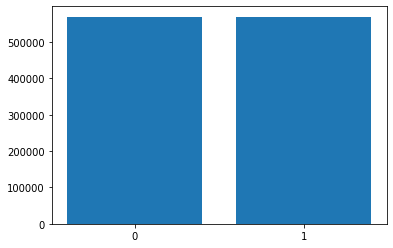

In [140]:
#plot the isFraud values to make sure we have solved class imbalance
labels = ['0','1']

plt.bar(labels,y_sm.value_counts())
plt.show()

In [141]:
#Decision Tree model
DTree = tree.DecisionTreeClassifier(random_state=0, criterion='entropy',max_depth=15,splitter='best', min_samples_split=30)
DTree = DTree.fit(X_train,Y_train)

In [142]:
#Decision Tree model
DTree

DecisionTreeClassifier(criterion='entropy', max_depth=15, min_samples_split=30,
                       random_state=0)

In [143]:
r = export_text(DTree)
print(r)

|--- feature_220 <= 1.50
|   |--- feature_260 <= 0.50
|   |   |--- feature_5 <= 0.50
|   |   |   |--- feature_0 <= 2.50
|   |   |   |   |--- feature_384 <= 86.90
|   |   |   |   |   |--- feature_390 <= 1.50
|   |   |   |   |   |   |--- feature_41 <= 17.50
|   |   |   |   |   |   |   |--- feature_392 <= -47.50
|   |   |   |   |   |   |   |   |--- feature_28 <= 1661.50
|   |   |   |   |   |   |   |   |   |--- feature_385 <= 16377.00
|   |   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |   |--- feature_385 >  16377.00
|   |   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |--- feature_28 >  1661.50
|   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |--- feature_392 >  -47.50
|   |   |   |   |   |   |   |   |--- feature_369 <= 1.50
|   |   |   |   |   |   |   |   |   |--- feature_387 <= 173.50
|   |   |   |   |   |   |   |   |   |   |--- feature_308 <= 100.00
|   |   |   |   |   |   |   |   |   |   |

In [144]:
#exproting the tree to plot the decision tree
dot_data = tree.export_graphviz(DTree,out_file=None,feature_names=None,class_names=None,filled=True,rounded=True,special_characters=True)

In [145]:
#making a source for decision tree
graph = graphviz.Source(dot_data)

In [146]:
#graph format png
graph.format = 'png'

In [147]:
#render Decision Tree
graph.render()

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.283109 to fit


'Source.gv.png'

In [148]:
from IPython.display import Image

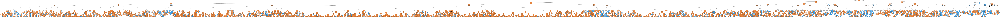

In [149]:
#export the image file
Image(filename='Source.gv.png',width=1000,height=300)

In [150]:
#prediction on the Training Data
pred = DTree.predict(X_train)
print("The accuracy is: " + str(metrics.accuracy_score(Y_train,pred)))

The accuracy is: 0.9801977850780641


In [151]:
#reading the test dataset
#checking the shape and columns of the test data set
#index set to TransactionID
test_transaction = pd.read_csv('ieee-fraud-detection/test_transaction.csv',index_col='TransactionID')
test_identity = pd.read_csv('ieee-fraud-detection/test_identity.csv',index_col='TransactionID')

print(list(test_transaction.columns))
print(test_transaction.index)
print(test_transaction.shape)

['TransactionDT', 'TransactionAmt', 'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6', 'addr1', 'addr2', 'dist1', 'dist2', 'P_emaildomain', 'R_emaildomain', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V

In [152]:
#checking the test identity columns and index
print(list(test_identity.columns))
print(test_identity.index)

['id-01', 'id-02', 'id-03', 'id-04', 'id-05', 'id-06', 'id-07', 'id-08', 'id-09', 'id-10', 'id-11', 'id-12', 'id-13', 'id-14', 'id-15', 'id-16', 'id-17', 'id-18', 'id-19', 'id-20', 'id-21', 'id-22', 'id-23', 'id-24', 'id-25', 'id-26', 'id-27', 'id-28', 'id-29', 'id-30', 'id-31', 'id-32', 'id-33', 'id-34', 'id-35', 'id-36', 'id-37', 'id-38', 'DeviceType', 'DeviceInfo']
Int64Index([3663586, 3663588, 3663597, 3663601, 3663602, 3663622, 3663624,
            3663626, 3663629, 3663658,
            ...
            4170224, 4170225, 4170226, 4170228, 4170229, 4170230, 4170233,
            4170234, 4170236, 4170239],
           dtype='int64', name='TransactionID', length=141907)


In [153]:
#combine both trans and identity
df_final_test = pd.merge(left=test_transaction,right=test_identity,on="TransactionID",how="outer")
print(df_final_test.head())
print(list(df_final_test.columns))
print(df_final_test.shape)

               TransactionDT  TransactionAmt ProductCD  card1  card2  card3  \
TransactionID                                                                 
3663549             18403224           31.95         W  10409  111.0  150.0   
3663550             18403263           49.00         W   4272  111.0  150.0   
3663551             18403310          171.00         W   4476  574.0  150.0   
3663552             18403310          284.95         W  10989  360.0  150.0   
3663553             18403317           67.95         W  18018  452.0  150.0   

                    card4  card5  card6  addr1  ...  id-31  id-32  id-33  \
TransactionID                                   ...                        
3663549              visa  226.0  debit  170.0  ...    NaN    NaN    NaN   
3663550              visa  226.0  debit  299.0  ...    NaN    NaN    NaN   
3663551              visa  226.0  debit  472.0  ...    NaN    NaN    NaN   
3663552              visa  166.0  debit  205.0  ...    NaN    NaN 

In [154]:
#check no of null values per column after merging the datasets
print(df_final_test.isna().sum())

TransactionDT          0
TransactionAmt         0
ProductCD              0
card1                  0
card2               8654
                   ...  
id-36             369714
id-37             369714
id-38             369714
DeviceType        369760
DeviceInfo        391634
Length: 432, dtype: int64


In [155]:
#checking the number of null values per column
#calculate the total number of rows
#using TransactionDT because it had 0 null values
df_final_test_sum_of_null_values = df_final_test.isna().sum()
df_final_test_no_of_rows = df_final_test['TransactionDT'].count()
print(df_final_test_no_of_rows)

506691


In [156]:
#find percentage of null values per column
per_df_final_test_null_values = (df_final_test_sum_of_null_values / df_final_test_no_of_rows) * 100

In [157]:
#printing the percentage of null values per column
#printing the max value of null values per column
print(list(per_df_final_test_null_values))
print(per_df_final_test_null_values.max())

[0.0, 0.0, 0.0, 0.0, 1.7079442895176746, 0.5924715457744464, 0.6090496969553436, 0.8973911121373777, 0.5934583404875949, 12.948522866993889, 12.948522866993889, 57.47427919580178, 92.8090295663432, 13.655659958436207, 73.18484046489873, 0.000592076827889187, 0.000592076827889187, 0.000592076827889187, 0.000592076827889187, 0.000592076827889187, 0.000592076827889187, 0.000592076827889187, 0.000592076827889187, 0.000592076827889187, 0.000592076827889187, 0.000592076827889187, 0.000592076827889187, 0.9370602596059532, 0.000592076827889187, 1.1902717829998954, 46.33376160223884, 40.0918903236884, 15.167232100037301, 44.28241275254543, 75.37295906183454, 88.13221470284651, 85.32873092279121, 85.32873092279121, 2.47586793528995, 34.837405835114495, 86.33210378712076, 75.64906422257353, 77.265433962711, 2.381925078598199, 34.861286267172694, 34.861286267172694, 34.861286267172694, 46.92110181550491, 61.10864412432824, 31.36803298262649, 46.38290397895364, 46.38014095375683, 46.38014095375683,

In [158]:
#Columns we will drop because of 90% or more null values
#These are the same as training data
col_list_test_drop = ['dist2', 'D7', 'id-07', 'id-08', 'id-18', 'id-21', 'id-22', 'id-23', 'id-24', 'id-25', 'id-26', 'id-27']

In [159]:
#drop the columns which have 90% or more null values same as training data
for i in col_list_test_drop:
    df_final_test.drop(i,axis=1,inplace=True)

print(list(df_final_test.columns))

['TransactionDT', 'TransactionAmt', 'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6', 'addr1', 'addr2', 'dist1', 'P_emaildomain', 'R_emaildomain', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V86', 'V87', 'V8

In [160]:
#checking the number of null values after dropping the columns
print(list(df_final_test.isna().sum()))

[0, 0, 0, 0, 8654, 3002, 3086, 4547, 3007, 65609, 65609, 291217, 69192, 370821, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4748, 3, 6031, 234769, 203142, 76851, 224375, 381908, 432353, 432353, 12545, 176518, 437437, 383307, 391497, 12069, 176639, 176639, 176639, 237745, 309632, 158939, 235018, 235004, 235004, 176518, 176518, 176518, 176518, 176518, 176518, 176518, 176518, 176518, 176518, 176518, 12589, 12589, 12589, 12589, 12589, 12589, 12589, 12589, 12589, 12589, 12589, 12589, 12589, 12589, 12589, 12589, 12589, 12589, 12589, 12589, 12589, 12589, 12589, 76854, 76854, 76854, 76854, 76854, 76854, 76854, 76854, 76854, 76854, 76854, 76854, 76854, 76854, 76854, 76854, 76854, 76854, 12899, 12899, 12899, 12899, 12899, 12899, 12899, 12899, 12899, 12899, 12899, 12899, 12899, 12899, 12899, 12899, 12899, 12899, 12899, 12899, 12899, 12899, 12081, 12081, 12081, 12081, 12081, 12081, 12081, 12081, 12081, 12081, 12081, 12081, 12081, 12081, 12081, 12081, 12081, 12081, 12081, 12081, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [161]:
#find the columns whose percentage of num values are not equal to 0
Non_zero_columns_test = list(dict(per_df_final_test_null_values[per_df_final_test_null_values != 0]).keys())
print(Non_zero_columns_test)

['card2', 'card3', 'card4', 'card5', 'card6', 'addr1', 'addr2', 'dist1', 'dist2', 'P_emaildomain', 'R_emaildomain', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V86', 'V87', 'V88', 'V89', 'V90', 'V91', 'V92', 'V93', 'V9

In [162]:
#fill null values for ['card2,card3,card5'] by mean values
for i in ['card2','card3','card5']:
    print(df_final_test[i].isna().sum())
    df_final_test[i].fillna(df_final_test[i].mean(),inplace=True)
    print(df_final_test[i].isna().sum())


8654
0
3002
0
4547
0


In [163]:
#fill null values for ['card4,card6'] by mean values
for i in ['card4','card6']:
    print(df_final_test[i].isna().sum())
    df_final_test[i].fillna(df_final_test[i].mode()[0],inplace=True)
    print(df_final_test[i].isna().sum())

3086
0
3007
0


In [164]:
#find percentage of null values per column after removing null values of columns ['card2','card3','card4','card5','card6']
df_final_test_sum_of_null_values = df_final_test.isna().sum()
df_final_test_no_of_rows = df_final_test['TransactionDT'].count()
print(df_final_test_no_of_rows)
per_df_final_test_null_values = (df_final_test_sum_of_null_values / df_final_test_no_of_rows) * 100
print(per_df_final_test_null_values[per_df_final_test_null_values != 0])
col_list_test = dict(per_df_final_test_null_values[per_df_final_test_null_values != 0]).keys()
print(col_list_test)

506691
addr1            12.948523
addr2            12.948523
dist1            57.474279
P_emaildomain    13.655660
R_emaildomain    73.184840
                   ...    
id-36            72.966364
id-37            72.966364
id-38            72.966364
DeviceType       72.975443
DeviceInfo       77.292472
Length: 368, dtype: float64
dict_keys(['addr1', 'addr2', 'dist1', 'P_emaildomain', 'R_emaildomain', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', '

In [165]:
#preprocessing of null values for ['addr1','addr2','dist1']
col_list_test = ['addr1','addr2','dist1']

for i in col_list_test:
    print(df_final_test[i].isna().sum())
    print(df_final_test[i].value_counts(dropna=False))

65609
NaN      65609
299.0    38710
204.0    35049
325.0    34151
264.0    32710
         ...  
363.0        1
361.0        1
209.0        1
179.0        1
383.0        1
Name: addr1, Length: 293, dtype: int64
65609
87.0    435934
NaN      65609
60.0      4041
96.0       608
32.0        61
         ...  
99.0         1
85.0         1
42.0         1
18.0         1
91.0         1
Name: addr2, Length: 73, dtype: int64
291217
NaN       291217
0.0        19278
1.0        18025
2.0        15687
3.0        12333
           ...  
1603.0         1
2188.0         1
2241.0         1
1121.0         1
2199.0         1
Name: dist1, Length: 1989, dtype: int64


In [166]:
#preprocessing of null values for ['addr1','addr2','dist1']
for i in col_list_test:
    print(df_final_test[i].isna().sum())
    df_final_test[i].fillna(df_final_test[i].mean(),inplace=True)
    print(df_final_test[i].isna().sum())

65609
0
65609
0
291217
0


In [167]:
#find percentage of null values per column after removing null values from #preprocessing of null values for ['addr1','addr2','dist1']
df_final_test_sum_of_null_values = df_final_test.isna().sum()
df_final_test_no_of_rows = df_final_test['TransactionDT'].count()
print(df_final_test_no_of_rows)
per_df_final_test_null_values = (df_final_test_sum_of_null_values / df_final_test_no_of_rows) * 100
print(per_df_final_test_null_values[per_df_final_test_null_values != 0])
col_list_test = dict(per_df_final_test_null_values[per_df_final_test_null_values != 0]).keys()
print(col_list_test)

506691
P_emaildomain    13.655660
R_emaildomain    73.184840
C1                0.000592
C2                0.000592
C3                0.000592
                   ...    
id-36            72.966364
id-37            72.966364
id-38            72.966364
DeviceType       72.975443
DeviceInfo       77.292472
Length: 365, dtype: float64
dict_keys(['P_emaildomain', 'R_emaildomain', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 

In [168]:
#making a new category of email_not_provided for both P_emaildomain,R_emaildomain to fill null values
email_not_provided = 'email_not_provided'
df_final_test['P_emaildomain'].fillna(email_not_provided,inplace=True)
print(df_final_test['P_emaildomain'].isna().sum())
df_final_test['R_emaildomain'].fillna(email_not_provided,inplace=True)
print(df_final_test['R_emaildomain'].isna().sum())

0
0


In [169]:
#find percentage of null values per column after null values preprocessing of P_emaildomain,R_emaildomain
df_final_test_sum_of_null_values = df_final_test.isna().sum()
df_final_test_no_of_rows = df_final_test['TransactionDT'].count()
print(df_final_test_no_of_rows)
per_df_final_test_null_values = (df_final_test_sum_of_null_values / df_final_test_no_of_rows) * 100
print(per_df_final_test_null_values[per_df_final_test_null_values != 0])
col_list_test = dict(per_df_final_test_null_values[per_df_final_test_null_values != 0]).keys()
print(col_list_test)

506691
C1             0.000592
C2             0.000592
C3             0.000592
C4             0.000592
C5             0.000592
                ...    
id-36         72.966364
id-37         72.966364
id-38         72.966364
DeviceType    72.975443
DeviceInfo    77.292472
Length: 363, dtype: float64
dict_keys(['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67

In [170]:
#D7 is deleted cuz of 90% null values and this not included in the loop
#preprocessing of null values for ['D1','D2','D3','D4','D5','D6','D8','D9','D10','D11','D12','D13','D14','D15','D16']
#null values replaced with mean

for i in range(1,7):
    print(df_final_test['D'+str(i)].isna().sum())
    df_final_test['D'+str(i)].fillna(df_final_test['D'+str(i)].mean(),inplace=True)
    print(df_final_test['D'+str(i)].isna().sum())
    
for i in range(8,16):
    print(df_final_test['D'+str(i)].isna().sum())
    df_final_test['D'+str(i)].fillna(df_final_test['D'+str(i)].mean(),inplace=True)
    print(df_final_test['D'+str(i)].isna().sum())

6031
0
234769
0
203142
0
76851
0
224375
0
381908
0
432353
0
432353
0
12545
0
176518
0
437437
0
383307
0
391497
0
12069
0


In [171]:
#find percentage of null values per column after preprocessing of null values of D1,.....D15 except D7
df_final_test_sum_of_null_values = df_final_test.isna().sum()
df_final_test_no_of_rows = df_final_test['TransactionDT'].count()
print(df_final_test_no_of_rows)
per_df_final_test_null_values = (df_final_test_sum_of_null_values / df_final_test_no_of_rows) * 100
print(per_df_final_test_null_values[per_df_final_test_null_values != 0])
col_list_test = dict(per_df_final_test_null_values[per_df_final_test_null_values != 0]).keys()
print(col_list_test)

506691
C1             0.000592
C2             0.000592
C3             0.000592
C4             0.000592
C5             0.000592
                ...    
id-36         72.966364
id-37         72.966364
id-38         72.966364
DeviceType    72.975443
DeviceInfo    77.292472
Length: 349, dtype: float64
dict_keys(['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V8

In [172]:
#preprocessing of M1....M9 null values with mode since these are categorical data
for i in range(1,10):
    print(df_final_test['M'+str(i)].isna().sum())
    df_final_test['M'+str(i)].fillna(df_final_test['M'+str(i)].mode()[0],inplace=True)
    print(df_final_test['M'+str(i)].isna().sum())

176639
0
176639
0
176639
0
237745
0
309632
0
158939
0
235018
0
235004
0
235004
0


In [173]:
#find percentage of null values per column after preprocessing of M1.......M9
df_final_test_sum_of_null_values = df_final_test.isna().sum()
df_final_test_no_of_rows = df_final_test['TransactionDT'].count()
print(df_final_test_no_of_rows)
per_df_final_test_null_values = (df_final_test_sum_of_null_values / df_final_test_no_of_rows) * 100
print(per_df_final_test_null_values[per_df_final_test_null_values != 0])
col_list_test = dict(per_df_final_test_null_values[per_df_final_test_null_values != 0]).keys()
print(col_list_test)

506691
C1             0.000592
C2             0.000592
C3             0.000592
C4             0.000592
C5             0.000592
                ...    
id-36         72.966364
id-37         72.966364
id-38         72.966364
DeviceType    72.975443
DeviceInfo    77.292472
Length: 340, dtype: float64
dict_keys(['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V86', 'V87', '

In [174]:
#preprocessing of null values for V1......V339 with median values
for i in range(1,340):
    print('V' + str(i) + '   ' + str(df_final_test['V'+str(i)].isna().sum()))
    df_final_test['V'+str(i)].fillna(df_final_test['V'+str(i)].median(),inplace = True)
    print('V' + str(i) + '   ' + str(df_final_test['V'+str(i)].isna().sum()))

V1   176518
V1   0
V2   176518
V2   0
V3   176518
V3   0
V4   176518
V4   0
V5   176518
V5   0
V6   176518
V6   0
V7   176518
V7   0
V8   176518
V8   0
V9   176518
V9   0
V10   176518
V10   0
V11   176518
V11   0
V12   12589
V12   0
V13   12589
V13   0
V14   12589
V14   0
V15   12589
V15   0
V16   12589
V16   0
V17   12589
V17   0
V18   12589
V18   0
V19   12589
V19   0
V20   12589
V20   0
V21   12589
V21   0
V22   12589
V22   0
V23   12589
V23   0
V24   12589
V24   0
V25   12589
V25   0
V26   12589
V26   0
V27   12589
V27   0
V28   12589
V28   0
V29   12589
V29   0
V30   12589
V30   0
V31   12589
V31   0
V32   12589
V32   0
V33   12589
V33   0
V34   12589
V34   0
V35   76854
V35   0
V36   76854
V36   0
V37   76854
V37   0
V38   76854
V38   0
V39   76854
V39   0
V40   76854
V40   0
V41   76854
V41   0
V42   76854
V42   0
V43   76854
V43   0
V44   76854
V44   0
V45   76854
V45   0
V46   76854
V46   0
V47   76854
V47   0
V48   76854
V48   0
V49   76854
V49   0
V50   76854
V50   0
V51   7

In [175]:
#find percentage of null values per column after preprocessing of V1.....V339
df_final_test_sum_of_null_values = df_final_test.isna().sum()
df_final_test_no_of_rows = df_final_test['TransactionDT'].count()
print(df_final_test_no_of_rows)
per_df_final_test_null_values = (df_final_test_sum_of_null_values / df_final_test_no_of_rows) * 100
print(per_df_final_test_null_values[per_df_final_test_null_values != 0])
col_list_test = dict(per_df_final_test_null_values[per_df_final_test_null_values != 0]).keys()
print(col_list_test)

506691
C1             0.000592
C2             0.000592
C3             0.000592
C4             0.000592
C5             0.000592
C6             0.000592
C7             0.000592
C8             0.000592
C9             0.000592
C10            0.000592
C11            0.000592
C12            0.000592
C13            0.937060
C14            0.000592
id-01         71.993385
id-02         72.966561
id-03         86.879380
id-04         86.879380
id-05         73.405882
id-06         73.405882
id-09         85.328731
id-10         85.328731
id-11         73.005639
id-12         71.993385
id-13         74.286893
id-14         85.917058
id-15         72.966364
id-16         75.182705
id-17         73.165894
id-19         73.177736
id-20         73.231615
id-28         73.005639
id-29         73.005639
id-30         86.054814
id-31         73.035834
id-32         86.052446
id-33         86.052446
id-34         85.755618
id-35         72.966364
id-36         72.966364
id-37         72.966364
id-38    

In [176]:
#preprocessing of null values of ['id_01','id_02','id_05','id_06','id_11','id_13','id_14','id_17','id_19','id_20']
#with mean values

col_list_test = ['id-01','id-02','id-05','id-06','id-11','id-13','id-14','id-17','id-19','id-20']
for i in col_list_test:
    print(df_final_test[i].isna().sum())
    df_final_test[i].fillna(df_final_test[i].mean(),inplace = True)
    print(df_final_test[i].isna().sum())

364784
0
369715
0
371941
0
371941
0
369913
0
376405
0
435334
0
370725
0
370785
0
371058
0


In [177]:
#find percentage of null values per column after preprocessing of null values for ['id_01','id_02','id_05','id_06','id_11','id_13','id_14','id_17','id_19','id_20']
df_final_test_sum_of_null_values = df_final_test.isna().sum()
df_final_test_no_of_rows = df_final_test['TransactionDT'].count()
print(df_final_test_no_of_rows)
per_df_final_test_null_values = (df_final_test_sum_of_null_values / df_final_test_no_of_rows) * 100
print(per_df_final_test_null_values[per_df_final_test_null_values != 0])
col_list_test = dict(per_df_final_test_null_values[per_df_final_test_null_values != 0]).keys()
print(col_list_test)

506691
C1             0.000592
C2             0.000592
C3             0.000592
C4             0.000592
C5             0.000592
C6             0.000592
C7             0.000592
C8             0.000592
C9             0.000592
C10            0.000592
C11            0.000592
C12            0.000592
C13            0.937060
C14            0.000592
id-03         86.879380
id-04         86.879380
id-09         85.328731
id-10         85.328731
id-12         71.993385
id-15         72.966364
id-16         75.182705
id-28         73.005639
id-29         73.005639
id-30         86.054814
id-31         73.035834
id-32         86.052446
id-33         86.052446
id-34         85.755618
id-35         72.966364
id-36         72.966364
id-37         72.966364
id-38         72.966364
DeviceType    72.975443
DeviceInfo    77.292472
dtype: float64
dict_keys(['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'id-03', 'id-04', 'id-09', 'id-10', 'id-12', 'id-15', 'id-16',

In [178]:
#preprocessing of null values for ['id_03','id_04','id_09','id_10','id_32']
#with median values

col_list_test = ['id-03','id-04','id-09','id-10','id-32']
for i in col_list_test:
    print(df_final_test[i].isna().sum())
    df_final_test[i].fillna(df_final_test[i].median(),inplace = True)
    print(df_final_test[i].isna().sum())

440210
0
440210
0
432353
0
432353
0
436020
0


In [179]:
#find percentage of null values per column after preprocessing of null values for ['id_03','id_04','id_09','id_10','id_32']
df_final_test_sum_of_null_values = df_final_test.isna().sum()
df_final_test_no_of_rows = df_final_test['TransactionDT'].count()
print(df_final_test_no_of_rows)
per_df_final_test_null_values = (df_final_test_sum_of_null_values / df_final_test_no_of_rows) * 100
print(per_df_final_test_null_values[per_df_final_test_null_values != 0])
col_list_test = dict(per_df_final_test_null_values[per_df_final_test_null_values != 0]).keys()
print(col_list_test)

506691
C1             0.000592
C2             0.000592
C3             0.000592
C4             0.000592
C5             0.000592
C6             0.000592
C7             0.000592
C8             0.000592
C9             0.000592
C10            0.000592
C11            0.000592
C12            0.000592
C13            0.937060
C14            0.000592
id-12         71.993385
id-15         72.966364
id-16         75.182705
id-28         73.005639
id-29         73.005639
id-30         86.054814
id-31         73.035834
id-33         86.052446
id-34         85.755618
id-35         72.966364
id-36         72.966364
id-37         72.966364
id-38         72.966364
DeviceType    72.975443
DeviceInfo    77.292472
dtype: float64
dict_keys(['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'id-12', 'id-15', 'id-16', 'id-28', 'id-29', 'id-30', 'id-31', 'id-33', 'id-34', 'id-35', 'id-36', 'id-37', 'id-38', 'DeviceType', 'DeviceInfo'])


In [180]:
#preprocessing of null values for ['id_12','id_15','id_16','id_28','id_29','id_30','id_31','id_33','id_34','id_35','id_36','id_37','id_38','DeviceInfo','DeviceType']
#with mode values as these columns have categroical data

col_list_test = ['id-12','id-15','id-16','id-28','id-29','id-30','id-31','id-33','id-34','id-35','id-36','id-37','id-38','DeviceInfo','DeviceType']
for i in col_list_test:
    print(df_final_test[i].isna().sum())
    df_final_test[i].fillna(df_final_test[i].mode()[0],inplace = True)
    print(df_final_test[i].isna().sum())

364784
0
369714
0
380944
0
369913
0
369913
0
436032
0
370066
0
436020
0
434516
0
369714
0
369714
0
369714
0
369714
0
391634
0
369760
0


In [181]:
#find percentage of null values per column after preprocessing of null values for ['id_12','id_15','id_16','id_28','id_29','id_30','id_31','id_33','id_34','id_35','id_36','id_37','id_38','DeviceInfo','DeviceType']
df_final_test_sum_of_null_values = df_final_test.isna().sum()
df_final_test_no_of_rows = df_final_test['TransactionDT'].count()
print(df_final_test_no_of_rows)
per_df_final_test_null_values = (df_final_test_sum_of_null_values / df_final_test_no_of_rows) * 100
print(per_df_final_test_null_values[per_df_final_test_null_values != 0])
col_list_test = dict(per_df_final_test_null_values[per_df_final_test_null_values != 0]).keys()
print(col_list_test)

506691
C1     0.000592
C2     0.000592
C3     0.000592
C4     0.000592
C5     0.000592
C6     0.000592
C7     0.000592
C8     0.000592
C9     0.000592
C10    0.000592
C11    0.000592
C12    0.000592
C13    0.937060
C14    0.000592
dtype: float64
dict_keys(['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14'])


In [182]:
#preprocessing of C null values with median
#i didnot find any null values of C columns in training data but there were in test data

for i in range(1,15):
    print(df_final_test['C'+ str(i)].isna().sum())
    df_final_test['C'+ str(i)].fillna(df_final_test['C'+ str(i)].median(),inplace = True)
    print(df_final_test['C'+ str(i)].isna().sum())

3
0
3
0
3
0
3
0
3
0
3
0
3
0
3
0
3
0
3
0
3
0
3
0
4748
0
3
0


In [183]:
#find percentage of null values per column after precossing of C columns
df_final_test_sum_of_null_values = df_final_test.isna().sum()
df_final_test_no_of_rows = df_final_test['TransactionDT'].count()
print(df_final_test_no_of_rows)
per_df_final_test_null_values = (df_final_test_sum_of_null_values / df_final_test_no_of_rows) * 100
print(per_df_final_test_null_values[per_df_final_test_null_values != 0])
col_list_test = dict(per_df_final_test_null_values[per_df_final_test_null_values != 0]).keys()
print(col_list_test)

506691
Series([], dtype: float64)
dict_keys([])


In [184]:
print(list(df_final_test.columns))

['TransactionDT', 'TransactionAmt', 'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6', 'addr1', 'addr2', 'dist1', 'P_emaildomain', 'R_emaildomain', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V86', 'V87', 'V8

In [185]:
sum(df_final_test.isna().sum())

0

In [186]:
#Label encoder for converting categorical data to Labels like 1,2,3,....,n depending on the number of values for one feature
col_list_test = col_list = ['ProductCD','card4','card6','P_emaildomain','R_emaildomain','M1','M2','M3','M4','M5','M6','M7','M8','M9','id-12','id-15','id-16','id-28','id-29','id-30','id-31','id-33','id-34','id-35','id-36','id-37','id-38','DeviceType','DeviceInfo']
for i in col_list_test:  
    # creating instance of labelencoder
    labelencoder = LabelEncoder()
    # Assigning numerical values and storing in another column
    df_final_test[str(i) + 'new'] = labelencoder.fit_transform(df_final_test[i])
    df_final_test.drop(columns=i,inplace=True)

print(list(df_final_test.columns))

['TransactionDT', 'TransactionAmt', 'card1', 'card2', 'card3', 'card5', 'addr1', 'addr2', 'dist1', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V86', 'V87', 'V88', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94', 'V95', 'V96', 'V97', 'V98', 'V99', 'V100', 'V101', 'V102', 'V103', 'V104'

In [187]:
#column of selected features after coorelation matrix
col_list3 = ['C1', 'C10', 'C11', 'C12', 'C13', 'C14', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'D1', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'D2', 'D3', 'D4', 'D5', 'D6', 'D8', 'D9', 'DeviceInfonew', 'DeviceTypenew', 'M1new', 'M2new', 'M3new', 'M4new', 'M5new', 'M6new', 'M7new', 'M8new', 'M9new', 'P_emaildomainnew', 'ProductCDnew', 'R_emaildomainnew', 'TransactionAmt', 'TransactionDT', 'V1', 'V10', 'V100', 'V101', 'V102', 'V103', 'V104', 'V105', 'V106', 'V107', 'V108', 'V109', 'V11', 'V110', 'V111', 'V112', 'V113', 'V114', 'V115', 'V116', 'V117', 'V118', 'V119', 'V12', 'V120', 'V121', 'V122', 'V123', 'V124', 'V125', 'V126', 'V127', 'V128', 'V129', 'V13', 'V130', 'V131', 'V132', 'V133', 'V134', 'V135', 'V136', 'V137', 'V138', 'V139', 'V14', 'V140', 'V141', 'V142', 'V143', 'V144', 'V145', 'V146', 'V147', 'V148', 'V149', 'V15', 'V150', 'V151', 'V152', 'V153', 'V154', 'V155', 'V156', 'V157', 'V158', 'V159', 'V16', 'V160', 'V161', 'V162', 'V163', 'V164', 'V165', 'V166', 'V167', 'V168', 'V169', 'V17', 'V170', 'V171', 'V172', 'V173', 'V174', 'V175', 'V176', 'V177', 'V178', 'V179', 'V18', 'V180', 'V181', 'V182', 'V183', 'V184', 'V185', 'V186', 'V187', 'V188', 'V189', 'V19', 'V190', 'V191', 'V192', 'V193', 'V194', 'V195', 'V196', 'V197', 'V198', 'V199', 'V2', 'V20', 'V200', 'V201', 'V202', 'V203', 'V204', 'V205', 'V206', 'V207', 'V208', 'V209', 'V21', 'V210', 'V211', 'V212', 'V213', 'V214', 'V215', 'V216', 'V217', 'V218', 'V219', 'V22', 'V220', 'V221', 'V222', 'V223', 'V224', 'V225', 'V226', 'V227', 'V228', 'V229', 'V23', 'V230', 'V231', 'V232', 'V233', 'V234', 'V235', 'V236', 'V237', 'V238', 'V239', 'V24', 'V240', 'V241', 'V242', 'V243', 'V244', 'V245', 'V246', 'V247', 'V248', 'V249', 'V25', 'V250', 'V251', 'V252', 'V253', 'V254', 'V255', 'V256', 'V257', 'V258', 'V259', 'V26', 'V260', 'V261', 'V262', 'V263', 'V264', 'V265', 'V266', 'V267', 'V268', 'V269', 'V27', 'V270', 'V271', 'V272', 'V273', 'V274', 'V275', 'V276', 'V277', 'V278', 'V279', 'V28', 'V280', 'V281', 'V282', 'V283', 'V284', 'V285', 'V286', 'V287', 'V288', 'V289', 'V29', 'V290', 'V291', 'V292', 'V293', 'V294', 'V295', 'V296', 'V297', 'V298', 'V299', 'V3', 'V30', 'V300', 'V301', 'V302', 'V303', 'V304', 'V305', 'V306', 'V307', 'V308', 'V309', 'V31', 'V310', 'V311', 'V312', 'V313', 'V314', 'V315', 'V316', 'V317', 'V318', 'V319', 'V32', 'V320', 'V321', 'V322', 'V323', 'V324', 'V325', 'V326', 'V327', 'V328', 'V329', 'V33', 'V330', 'V331', 'V332', 'V333', 'V334', 'V335', 'V336', 'V337', 'V338', 'V339', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V4', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V5', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V6', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V7', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V8', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V86', 'V87', 'V88', 'V89', 'V9', 'V90', 'V91', 'V92', 'V93', 'V94', 'V95', 'V96', 'V97', 'V98', 'V99', 'addr1', 'addr2', 'card1', 'card2', 'card3', 'card4new', 'card5', 'card6new', 'dist1', 'id-01', 'id-02', 'id-03', 'id-04', 'id-05', 'id-06', 'id-09', 'id-10', 'id-11', 'id-12new', 'id-13', 'id-14', 'id-15new', 'id-16new', 'id-17', 'id-19', 'id-20', 'id-28new', 'id-29new', 'id-30new', 'id-31new', 'id-32', 'id-33new', 'id-34new', 'id-35new', 'id-36new', 'id-37new', 'id-38new']

In [188]:
df_final_test.index

Int64Index([3663549, 3663550, 3663551, 3663552, 3663553, 3663554, 3663555,
            3663556, 3663557, 3663558,
            ...
            4170230, 4170231, 4170232, 4170233, 4170234, 4170235, 4170236,
            4170237, 4170238, 4170239],
           dtype='int64', name='TransactionID', length=506691)

In [189]:
#creating the dataframe with selected feature
df_final_test_1 = pd.DataFrame(df_final_test,columns=col_list3,index=df_final_test.index)
df_final_test_1.index

Int64Index([3663549, 3663550, 3663551, 3663552, 3663553, 3663554, 3663555,
            3663556, 3663557, 3663558,
            ...
            4170230, 4170231, 4170232, 4170233, 4170234, 4170235, 4170236,
            4170237, 4170238, 4170239],
           dtype='int64', name='TransactionID', length=506691)

In [190]:
#converting to numpy array
X_test = df_final_test_1.to_numpy()
print(X_test.shape)

(506691, 420)


In [191]:
#converting to numpy array for Y_test
Y_test = pd.DataFrame(columns=['isFraud'],data=np.zeros(X_test.shape[0]))
print(Y_test.shape)

(506691, 1)


In [192]:
Y_test = Y_test.to_numpy()
print(Y_test)

[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]


In [193]:
print(Y_test.shape)

(506691, 1)


In [194]:
pred = DTree.predict(X_test)
print(pred)

[0 0 0 ... 0 0 0]


In [195]:
isFraud = pd.DataFrame(pred,columns=['isFraud'],index=df_final_test.index)
isFraud

,isFraud
TransactionID,
3663549,0
3663550,0
3663551,0
3663552,0
3663553,0
...,...
4170235,0
4170236,0
4170237,0


In [196]:
print(isFraud)

               isFraud
TransactionID         
3663549              0
3663550              0
3663551              0
3663552              0
3663553              0
...                ...
4170235              0
4170236              0
4170237              0
4170238              0
4170239              0

[506691 rows x 1 columns]


In [197]:
isFraud.to_csv('submission.csv',sep=',',index=True)